#Exporación y Procesamiento de Datos

##Librerías

In [ ]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 62.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 132.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 64.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 37.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 109.2 MB/s

In [ ]:
from google.colab import files

import os
import re
import cv2
import time
import glob
import psutil
import zipfile
import subprocess
import collections
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm import tqdm
from itertools import chain
from collections import Counter

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split

from torchvision import transforms, models
from torch.utils.data import Dataset, DataLoader

import torch
import torch.amp
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from PIL import UnidentifiedImageError, Image

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


##Análisis del Dataset

In [ ]:
# Cargar el CSV
csv_original = '/content/Data_Entry_2017_v2020.csv'
df = pd.read_csv(csv_original)

# Reemplazar etiquetas
reemplazos = {
    'No Finding': 'Normal',
    'Atelectasis': 'Atelectasia',
    'Cardiomegaly': 'Cardiomegalia',
    'Consolidation': 'Consolidacion',
    'Edema': 'Edema_Pulmonar',
    'Effusion': 'Efusion',
    'Emphysema': 'Enfisema',
    'Infiltration': 'Infiltracion',
    'Mass': 'Masa',
    'Nodule': 'Nodulo_Pulmonar',
    'Pleural_Thickening': 'Engrosamiento_Pleural',
    'Pneumonia': 'Neumonia',
    'Pneumothorax': 'Neumotorax'
}

# Aplicar reemplazos en las etiquetas separadas por '|'
def reemplazar_etiquetas(texto):
    etiquetas = texto.split('|')
    etiquetas_mod = [reemplazos.get(e, e) for e in etiquetas]
    return '|'.join(etiquetas_mod)

df['Finding Labels'] = df['Finding Labels'].apply(reemplazar_etiquetas)

# One-hot encoding actualizado
df_one_hot = df['Finding Labels'].str.get_dummies(sep='|')

# Eliminar "Normal" si deseas ignorar los casos sin hallazgos
if 'Normal' in df_one_hot.columns:
    df_one_hot = df_one_hot.drop('Normal', axis=1)

# Crear matriz de coocurrencia
pathology_labels = sorted(df_one_hot.columns.tolist())
co_occurrence_matrix = df_one_hot.T.dot(df_one_hot)

# Crear matriz de correlación basada en la clase menos frecuente
corr_matrix = pd.DataFrame(np.zeros(co_occurrence_matrix.shape), index=pathology_labels, columns=pathology_labels)
totals = np.diag(co_occurrence_matrix)

for i in range(len(pathology_labels)):
    for j in range(len(pathology_labels)):
        if i == j:
            corr_matrix.iloc[i, j] = 1.0
        else:
            intersection = co_occurrence_matrix.iloc[i, j]
            min_total = min(totals[i], totals[j])
            if min_total > 0:
                corr_matrix.iloc[i, j] = intersection / min_total


Heatmap de Correlación Normalizada de Patologías


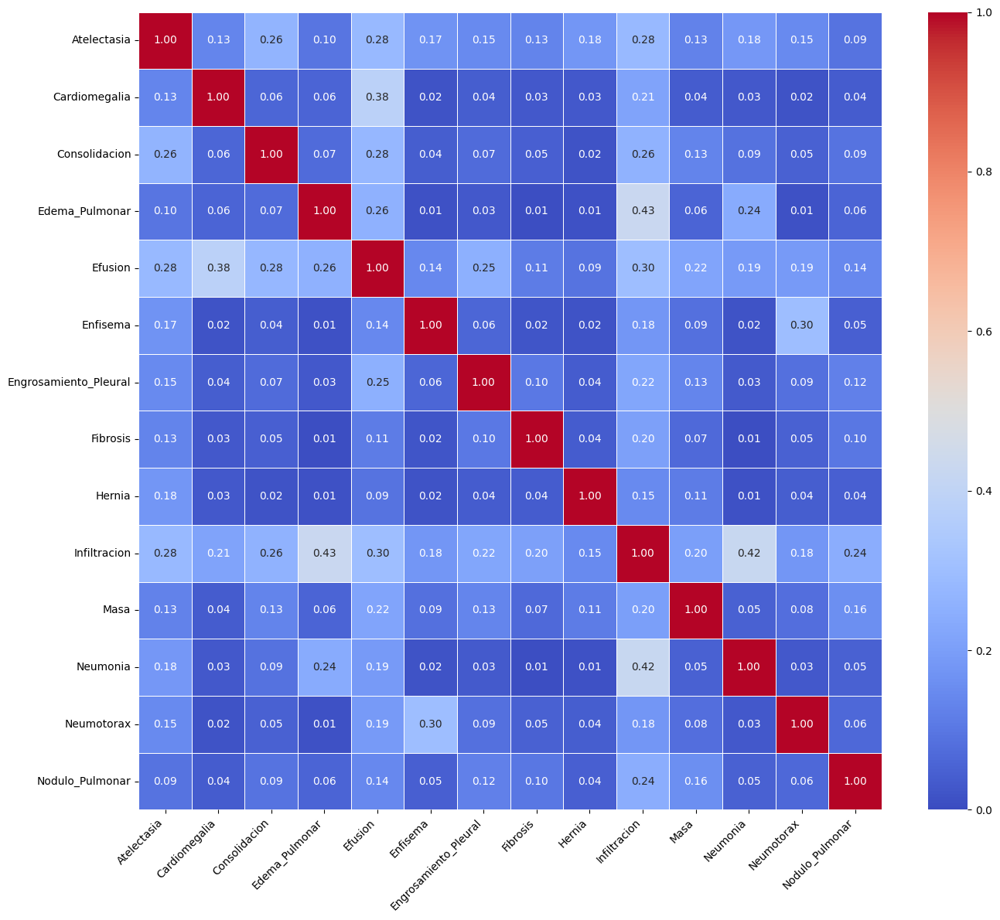

In [ ]:
print("Heatmap de Correlación Normalizada de Patologías")
plt.figure(figsize=(14, 12))
sns.heatmap(
    corr_matrix,
    annot=True, fmt='.2f', cmap='coolwarm', linewidths=.5, vmin=0, vmax=1)
#plt.title('Heatmap de Correlación Normalizada de Patologías', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
if 'Efusion' in df_one_hot.columns:
    df_one_hot = df_one_hot.drop('Efusion', axis=1)

if 'Infiltracion' in df_one_hot.columns:
    df_one_hot = df_one_hot.drop('Infiltracion', axis=1)

if 'Neumonia' in df_one_hot.columns:
    df_one_hot = df_one_hot.drop('Neumonia', axis=1)

pathology_labels = sorted(df_one_hot.columns.tolist())
co_occurrence_matrix = df_one_hot.T.dot(df_one_hot)
corr_matrix = pd.DataFrame(np.zeros(co_occurrence_matrix.shape), index=pathology_labels, columns=pathology_labels)
totals = np.diag(co_occurrence_matrix)

# Bucle para rellenar la nueva matriz
for i in range(len(pathology_labels)):
    for j in range(len(pathology_labels)):
        # Si estamos en la diagonal, la correlación es 1.0 (100%)
        if i == j:
            corr_matrix.iloc[i, j] = 1.0
            continue

        # El número de veces que A y B ocurren juntas
        intersection = co_occurrence_matrix.iloc[i, j]
        # El mínimo entre el total de A y el total de B
        min_total = min(totals[i], totals[j])

        if min_total > 0:
            # La correlación es la intersección dividida por el total de la clase más rara
            corr_matrix.iloc[i, j] = intersection / min_total

Heatmap de Correlación Normalizada de Patologías V2


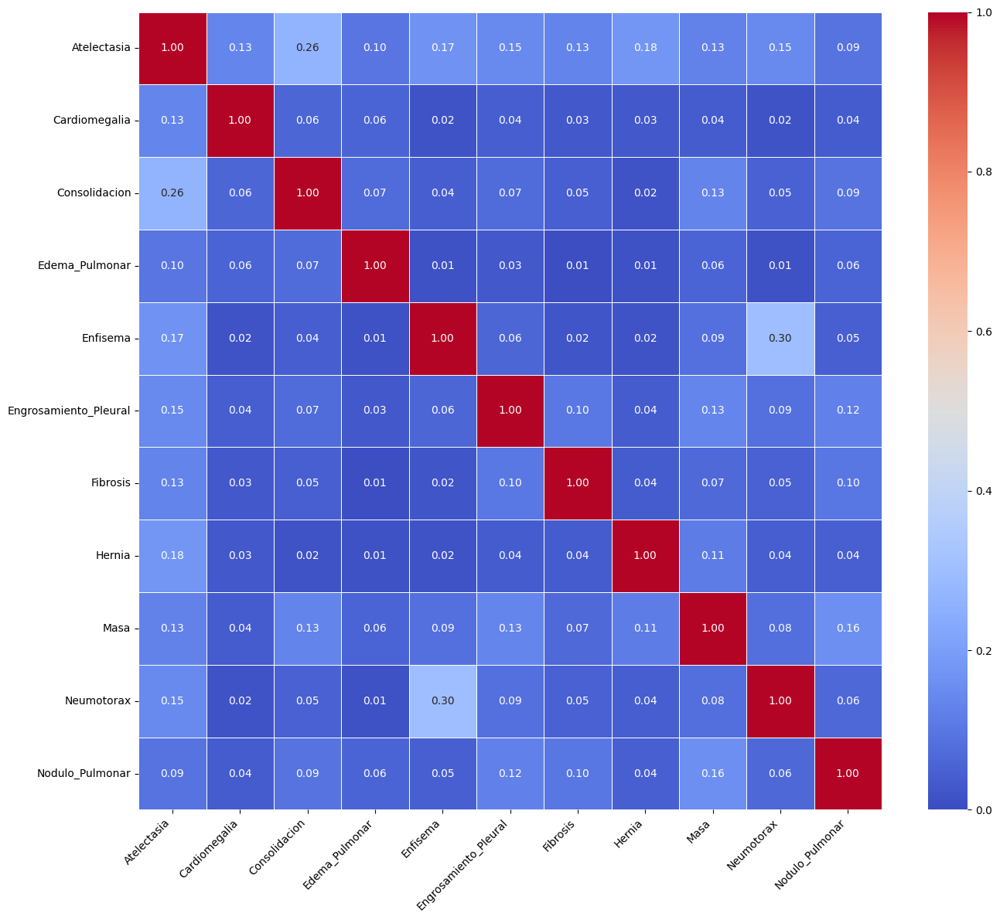

In [ ]:
print("Heatmap de Correlación Normalizada de Patologías V2")
plt.figure(figsize=(14, 12))
sns.heatmap(
    corr_matrix,
    annot=True, fmt='.2f', cmap='coolwarm', linewidths=.5, vmin=0, vmax=1)
#plt.title('Heatmap de Correlación Normalizada de Patologías V2', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
if 'Consolidacion' in df_one_hot.columns:
    df_one_hot = df_one_hot.drop('Consolidacion', axis=1)

if 'Efisema' in df_one_hot.columns:
    df_one_hot = df_one_hot.drop('Efisema', axis=1)

if 'Atelectasia' in df_one_hot.columns:
    df_one_hot = df_one_hot.drop('Atelectasia', axis=1)

pathology_labels = sorted(df_one_hot.columns.tolist())
co_occurrence_matrix = df_one_hot.T.dot(df_one_hot)
corr_matrix = pd.DataFrame(np.zeros(co_occurrence_matrix.shape), index=pathology_labels, columns=pathology_labels)
totals = np.diag(co_occurrence_matrix)

# Bucle para rellenar la nueva matriz
for i in range(len(pathology_labels)):
    for j in range(len(pathology_labels)):
        # Si estamos en la diagonal, la correlación es 1.0 (100%)
        if i == j:
            corr_matrix.iloc[i, j] = 1.0
            continue

        # El número de veces que A y B ocurren juntas
        intersection = co_occurrence_matrix.iloc[i, j]
        # El mínimo entre el total de A y el total de B
        min_total = min(totals[i], totals[j])

        if min_total > 0:
            # La correlación es la intersección dividida por el total de la clase más rara
            corr_matrix.iloc[i, j] = intersection / min_total

Heatmap de Correlación Normalizada de Patologías V3


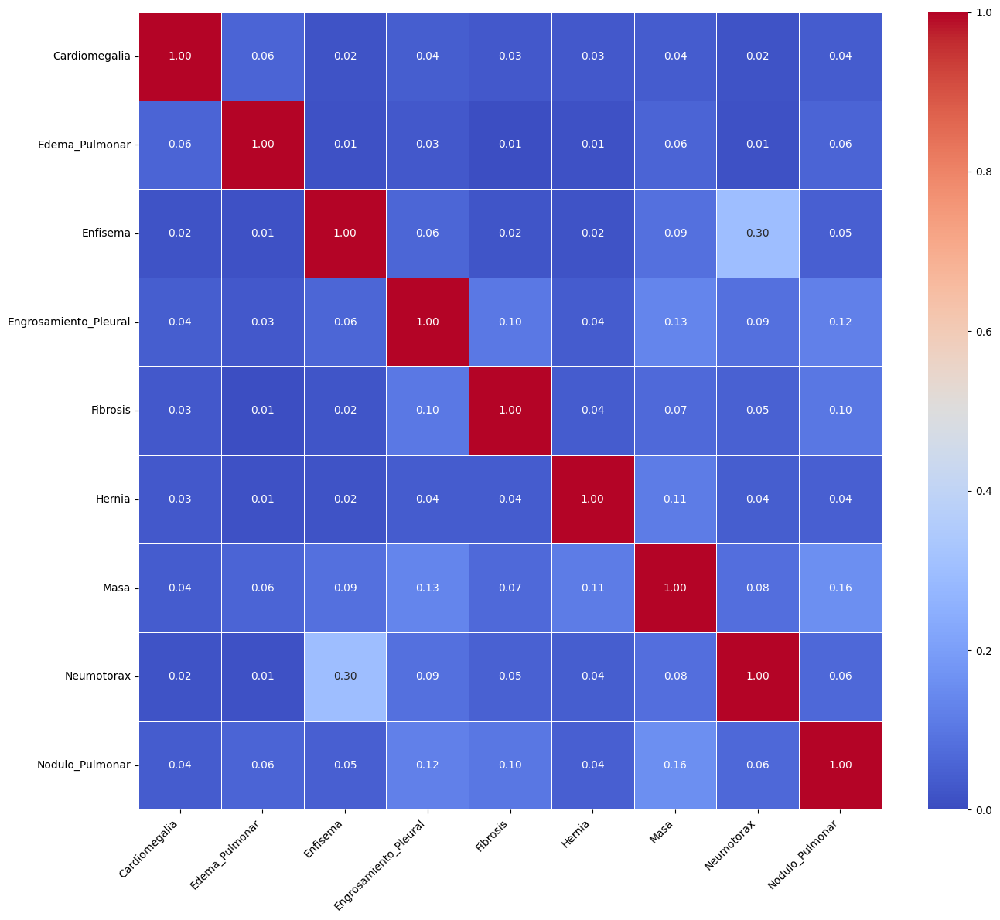

In [ ]:
print("Heatmap de Correlación Normalizada de Patologías V3")
plt.figure(figsize=(14, 12))
sns.heatmap(
    corr_matrix,
    annot=True, fmt='.2f', cmap='coolwarm', linewidths=.5, vmin=0, vmax=1)
#plt.title('Heatmap de Correlación Normalizada de Patologías V3', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
# ✅ 3. Separar todas las etiquetas
df['Labels'] = df['Finding Labels'].str.split('|')

# ✅ 4. Definir las etiquetas relevantes con los nuevos nombres en español
etiquetas_relevantes = {
    'Normal',
    'Cardiomegalia',
    'Edema_Pulmonar',
    'Fibrosis',
    'Hernia',
    'Masa',
    'Nodulo_Pulmonar',
    'Engrosamiento_Pleural',
    'Neumotorax'
}

# ✅ 5. Crear columnas auxiliares para etiquetas relevantes y no relevantes
df['Labels_filtradas'] = df['Labels'].apply(lambda lista: [e for e in lista if e in etiquetas_relevantes])
df['otras_etiquetas'] = df['Labels'].apply(lambda lista: [e for e in lista if e not in etiquetas_relevantes])

# ✅ 6. Filtrar: conservar solo imágenes con una única etiqueta relevante y ninguna irrelevante
df_monoclase = df[(df['Labels_filtradas'].map(len) == 1) & (df['otras_etiquetas'].map(len) == 0)].copy()

# ✅ 7. Crear columna con la clase asignada
df_monoclase['Clase'] = df_monoclase['Labels_filtradas'].str[0]

# ✅ 8. Mostrar resultados
total_monoclase = len(df_monoclase)
conteo_monoclase = df_monoclase['Clase'].value_counts()

print(f"Total de imágenes por clase: {total_monoclase}\n")
print("Distribución por clase:")
print(conteo_monoclase)


Total de imágenes por clase: 71083

Distribución por clase:
Clase
Normal                   60361
Nodulo_Pulmonar           2705
Neumotorax                2194
Masa                      2139
Engrosamiento_Pleural     1126
Cardiomegalia             1093
Fibrosis                   727
Edema_Pulmonar             628
Hernia                     110
Name: count, dtype: int64


In [ ]:
#Se escoge al ser las clases que disponen de mayor número de imaágenes
clases_relevantes = {'Engrosamiento_Pleural', 'Neumotorax', 'Nodulo_Pulmonar', 'Cardiomegalia', 'Normal'}

##Preprocesamiento Local

Para el procesamiento se descargó las imágenes en local, en caso de querer replicar este proceso desde 0 se debe descargar las imagenes de:
https://nihcc.app.box.com/v/ChestXray-NIHCC/folder/37178474737

Se debe descomprimir los 12 archivos comprimidos y seguir las indicaciones y los códigos comentados.

Se realizó la selección de imágenes en base a las condiciones:


*   Las imágenes deben pertenecer a las clases relevantes seleccionadas
*   Las imagenes deben tener unicamente una enfermedad por imagen



Caso contrario se debe unicamente descargar el comprimido ya listo del repositorio TFM, mandar a ejecutar todo el código y cargar el comprimido listo en:
Preprocesamiento Google Colab > Apartado 1



In [ ]:

#import os
#import shutil
#import pandas as pd
#from collections import defaultdict
#
## Rutas
#csv_path = "Data_Entry_2017_v2020.csv"
#output_dir = "clasificacion_imgs"
#
## Diccionario de reemplazo de etiquetas al español
#reemplazos = {
#    'No Finding': 'Normal',
#    'Cardiomegaly': 'Cardiomegalia',
#    'Pneumothorax': 'Neumotorax',
#    'Nodule': 'Nodulo_Pulmonar',
#    'Pleural_Thickening': 'Engrosamiento_Pleural'
#}
#
## Lista de etiquetas seleccionadas (en español)
#etiquetas_objetivo = list(reemplazos.values()) + ['Normal']
#
## Crear carpetas por cada etiqueta
#for etiqueta in etiquetas_objetivo:
#    os.makedirs(os.path.join(output_dir, etiqueta), exist_ok=True)
#
## Cargar CSV
#df = pd.read_csv(csv_path)
#
## Reemplazar etiquetas
#def reemplazar_etiquetas(etiquetas_str):
#    etiquetas = etiquetas_str.split('|')
#    etiquetas_mod = [reemplazos.get(e, e) for e in etiquetas]
#    return etiquetas_mod
#
#df['Labels'] = df['Finding Labels'].apply(reemplazar_etiquetas)
#
## Función para encontrar una imagen en subcarpetas images_001 a images_012
#def buscar_imagen(nombre_imagen):
#    for i in range(1, 13):
#        subdir = f"images_{i:03d}"
#        ruta = os.path.join(subdir, nombre_imagen)
#        if os.path.exists(ruta):
#            return ruta
#    return None
#
#conteo = defaultdict(int)
#
#for _, row in df.iterrows():
#    nombre_imagen = row['Image Index']
#    etiquetas = row['Labels']
#
#    if len(etiquetas) == 1 and etiquetas[0] in etiquetas_objetivo:
#        clase = etiquetas[0]
#        destino = os.path.join(output_dir, clase, nombre_imagen)
#
#        origen = buscar_imagen(nombre_imagen)
#        if origen and not os.path.exists(destino):
#            shutil.copy2(origen, destino)
#            conteo[clase] += 1
#
#
#print("Total Imágenes:")
#for clase in etiquetas_objetivo:
#    print(f"- {clase}: {conteo[clase]} imágenes")

Posterior a extraer las imágenes relevantes se aplica la redimensionalidad de las imágenes  a 224x224 pixeles.

In [ ]:

#import os
#from PIL import Image
#
## Carpeta raíz donde está el script
#base_dir = os.path.dirname(os.path.abspath(__file__))
#
## Carpetas (clases) que contienen las imágenes originales
#root_dirs = ['Normal', 'Cardiomegalia', 'Neumotorax', 'Nodulo_Pulmonar', 'Engrosamiento_Pleural']
#
## Tamaño de redimensionamiento
#target_size = (224, 224)
#
#print("Iniciando redimensionamiento a 224x224...\n")
#
## Procesar cada carpeta de clase
#for root in root_dirs:
#    input_path = os.path.join(base_dir, "clasificacion_imgs", root)
#    output_path = os.path.join(base_dir, "clasificacion_imgs_224", root)
#    os.makedirs(output_path, exist_ok=True)
#
#    for file in os.listdir(input_path):
#        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
#            src = os.path.join(input_path, file)
#            dst = os.path.join(output_path, file)
#
#            try:
#                with Image.open(src) as img:
#                    original_size = img.size
#                    img = img.convert("RGB")
#                    img = img.resize(target_size)
#                    img.save(dst)
#                    print(f"✅ {file} | {original_size} → {target_size} | Guardado en: {output_path}")
#            except Exception as e:
#                print(f"❌ Error procesando {src}: {e}")
#
#print("\nRedimensionamiento finalizado con éxito.")

Posterior a realizar el redimensionamiento se tiene que aplicar el submuestreo de la clase Normal al disponer más de 59K de imágenes, en este trabajo se limitó a 10K las imágenes por cada clase

In [ ]:
#import os
#import random
#import shutil
#
## Ruta origen y destino
#origen = 'clasificacion_imgs_224/NormalV1'
#destino = 'clasificacion_imgs_224/Normal'
#cantidad = 10000
#
## Crear carpeta destino si no existe
#os.makedirs(destino, exist_ok=True)
#
## Obtener lista de imágenes (extensiones comunes)
#imagenes = [f for f in os.listdir(origen)
#            if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
#
## Validar cantidad
#if len(imagenes) < cantidad:
#    raise ValueError(f"Solo hay {len(imagenes)} imágenes, no se pueden seleccionar {cantidad}.")
#
## Seleccionar aleatoriamente 10k
#seleccionadas = random.sample(imagenes, cantidad)
#
## Copiar imágenes
#for nombre in seleccionadas:
#    origen_path = os.path.join(origen, nombre)
#    destino_path = os.path.join(destino, nombre)
#    shutil.copy2(origen_path, destino_path)
#
#print(f"✅ Se copiaron {cantidad} imágenes a '{destino}' correctamente.")

Se requiere comprimir las imagenes de resultados para la carga a Colab

In [ ]:
#import os
#import shutil
#from zipfile import ZipFile
#
#base_dir = os.path.dirname(os.path.abspath(__file__))
#output_zip = os.path.join(base_dir, 'clasificacion_imgs_224.zip')
#
## Rutas origen
#clases = ['Cardiomegalia', 'Neumotorax', 'Nodulo_Pulmonar', 'Engrosamiento_Pleural']
#normal_v1 = os.path.join(base_dir, 'clasificacion_imgs_224', 'NormalV1')
#otros = [os.path.join(base_dir, 'clasificacion_imgs_224', clase) for clase in clases]
#
#print("Compresión ZIP...")
#
#with ZipFile(output_zip, 'w') as zipf:
#    # Agregar NormalV1 como 'Normal'
#    for file in os.listdir(normal_v1):
#        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
#            ruta_absoluta = os.path.join(normal_v1, file)
#            ruta_en_zip = os.path.join('Normal', file)
#            zipf.write(ruta_absoluta, ruta_en_zip)
#
#    # Agregar otras clases
#    for carpeta in otros:
#        clase = os.path.basename(carpeta)
#        for file in os.listdir(carpeta):
#            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
#                ruta_absoluta = os.path.join(carpeta, file)
#                ruta_en_zip = os.path.join(clase, file)
#                zipf.write(ruta_absoluta, ruta_en_zip)
#
#print(f"ZIP generado exitosamente en: {output_zip}")

Una vez realizado el procesamiento de las imagenes estan listas para usar, para este trabajo se utilizá colab por su entorno de trabajo preconfigurado, permite trabajo colaborativo y escalabilidad sin afectar al entorno, evitando complicaciones en comparación entornos locales

##Preprocesamiento Google Colab

###Apartado 1 – Subida de ZIP

In [ ]:
start = time.perf_counter()
uploaded = files.upload()
for fn in uploaded.keys():
  print(f'Archivo subido: {fn} ({len(uploaded[fn])} bytes)')
end = time.perf_counter()
print(f"Tiempo de Ejecucion: {end - start:.2f} segundos")


Saving clasificacion_imgs_224.zip to clasificacion_imgs_224.zip
Archivo subido: clasificacion_imgs_224.zip (560761093 bytes)
Tiempo de Ejecucion: 3867.11 segundos


###Apartado 2 – Descomprimir ZIP clasificacion_imgs.zip

In [ ]:
start = time.perf_counter()
zip_path = '/content/clasificacion_imgs_224.zip'
extract_path = '/content/clasificacion_imgs_224'
os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

image_count = sum(len([f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
                  for _, _, files in os.walk(extract_path))

end = time.perf_counter()
print(f"Total imágenes: {image_count}")
print(f"Tiempo de Ejecucion: {end - start:.2f} segundos")


Total imágenes: 17021
Tiempo de Ejecucion: 3.97 segundos


###Apartado 3 – Cargar CSV y definir carpetas

In [ ]:
start = time.perf_counter()

# Rutas reales con imágenes redimensionadas y balanceadas
rutas_completas = [
    '/content/clasificacion_imgs_224/Engrosamiento_Pleural',
    '/content/clasificacion_imgs_224/Neumotorax',
    '/content/clasificacion_imgs_224/Nodulo_Pulmonar',
    '/content/clasificacion_imgs_224/Cardiomegalia',
    '/content/clasificacion_imgs_224/Normal'
]

print("Dataset cargado. Filas:", len(df))
print("Carpetas reales de imágenes redimensionadas:")
for carpeta in rutas_completas:
    print("-", carpeta)

end = time.perf_counter()
print(f"Tiempo de Ejecucion: {end - start:.2f} segundos")


Dataset cargado. Filas: 112120
Carpetas reales de imágenes redimensionadas:
- /content/clasificacion_imgs_224/Engrosamiento_Pleural
- /content/clasificacion_imgs_224/Neumotorax
- /content/clasificacion_imgs_224/Nodulo_Pulmonar
- /content/clasificacion_imgs_224/Cardiomegalia
- /content/clasificacion_imgs_224/Normal
Tiempo de Ejecucion: 0.00 segundos


###Apartado 4 – Filtrar etiquetas relevantes

In [ ]:
start = time.perf_counter()

# Normalizar etiquetas
df['Finding Labels'] = df['Finding Labels'].replace({'No Finding': 'Normal'})
df['Labels'] = df['Finding Labels'].str.split('|')

# Separar etiquetas
df['Labels_filtradas'] = df['Labels'].apply(lambda lista: [e for e in lista if e in clases_relevantes])
df['otras_etiquetas'] = df['Labels'].apply(lambda lista: [e for e in lista if e not in clases_relevantes])

# Filtrar: solo una clase relevante y sin etiquetas extra
df_monoclase = df[(df['Labels_filtradas'].map(len) == 1) & (df['otras_etiquetas'].map(len) == 0)].copy()
df_monoclase['Clase'] = df_monoclase['Labels_filtradas'].str[0]

# Mostrar distribución
conteo_monoclase = df_monoclase['Clase'].value_counts()
print("Imágenes Seleccionadas:")
print(conteo_monoclase)

end = time.perf_counter()
print(f"Tiempo de Ejecucion: {end - start:.2f} segundos")


Imágenes Seleccionadas:
Clase
Normal                   60361
Nodulo_Pulmonar           2705
Neumotorax                2194
Engrosamiento_Pleural     1126
Cardiomegalia             1093
Name: count, dtype: int64
Tiempo de Ejecucion: 0.92 segundos


###Apartado 5 – Asociar imágenes con rutas

In [ ]:
start = time.perf_counter()

# Crear diccionario nombre archivo - ruta completa
all_image_paths = {}
for carpeta in rutas_completas:
    if os.path.exists(carpeta):
        for archivo in os.listdir(carpeta):
            if archivo.lower().endswith(('.jpg', '.jpeg', '.png')):
                all_image_paths[archivo] = os.path.join(carpeta, archivo)

# Filtrar df_monoclase por imágenes disponibles físicamente
df_final = df_monoclase[df_monoclase['Image Index'].isin(all_image_paths.keys())].copy()
df_final['Path'] = df_final['Image Index'].map(all_image_paths)

print(f"Total imágenes cargadas: {len(all_image_paths)}")
print(f"Imágenes cargadas con ruta: {len(df_final)}")

end = time.perf_counter()
print(f"Tiempo de Ejecucion: {end - start:.2f} segundos")


Total imágenes cargadas: 17021
Imágenes cargadas con ruta: 17021
Tiempo de Ejecucion: 0.05 segundos


###Apartado 6 – Distribución de clases existentes

In [ ]:
start = time.perf_counter()

#Contar ocurrencias por clase en df_final
conteo_existentes = Counter(df_final['Clase'])

print("Total imágenes existentes por clase:")
for etiqueta, cantidad in conteo_existentes.items():
    print(f"{etiqueta}: {cantidad}")

end = time.perf_counter()
print(f"Tiempo de Ejecucion: {end - start:.2f} segundos")


Total imágenes existentes por clase:
Cardiomegalia: 1082
Normal: 10000
Nodulo_Pulmonar: 2669
Neumotorax: 2161
Engrosamiento_Pleural: 1109
Tiempo de Ejecucion: 0.00 segundos


###Apartado 7 – Data Augmentation hasta 10K

In [ ]:
start = time.perf_counter()

#Clases a aumentar y sus ubicaciones
clases_aumentar = {
    'Engrosamiento_Pleural': '/content/clasificacion_imgs_224/Engrosamiento_Pleural',
    'Cardiomegalia': '/content/clasificacion_imgs_224/Cardiomegalia',
    'Neumotorax': '/content/clasificacion_imgs_224/Neumotorax',
    'Nodulo_Pulmonar': '/content/clasificacion_imgs_224/Nodulo_Pulmonar'
}
objetivo_clase = 10000

#Generador de aumentos
datagen = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.1,
    width_shift_range=0.05,
    height_shift_range=0.05,
    fill_mode='nearest'
)

conteo_aumentadas = {}

for clase, ruta_original in clases_aumentar.items():
    archivos = [f for f in os.listdir(ruta_original) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    total_originales = len(archivos)
    total_requerido = max(0, objetivo_clase - total_originales)
    conteo_aumentadas[clase] = 0

    print(f"\nData Augmentation - {clase}:")
    print(f"Originales: {total_originales} | Objetivo: {objetivo_clase}")

    if total_requerido <= 0:
        print(f"{clase} - Data augmentation finalizado.")
        continue

    carpeta_destino = ruta_original + '_aug'
    os.makedirs(carpeta_destino, exist_ok=True)

    index_img = 0  #índice para reiniciar desde el principio si es necesario

    while conteo_aumentadas[clase] < total_requerido:
        nombre_img = archivos[index_img % total_originales]
        ruta_img = os.path.join(ruta_original, nombre_img)

        try:
            img = load_img(ruta_img, target_size=(224, 224))
            x = img_to_array(img)
            x = x.reshape((1,) + x.shape)

            for batch in datagen.flow(
                x,
                batch_size=1,
                save_to_dir=carpeta_destino,
                save_prefix=f"{clase.lower()}_{os.path.splitext(nombre_img)[0]}",
                save_format='png'):

                conteo_aumentadas[clase] += 1
                break  # generar solo una por iteración

        except UnidentifiedImageError:
            print(f"[❌] Imagen no válida: {nombre_img}")
            continue

        index_img += 1  # avanzar al siguiente archivo

print("\nResumen Data Augmentation:")
for clase, cantidad in conteo_aumentadas.items():
    print(f"{clase}: {cantidad} aumentadas")

end = time.perf_counter()
print(f"\nTiempo de Ejecucion: {end - start:.2f} segundos")



Data Augmentation - Engrosamiento_Pleural:
Originales: 1109 | Objetivo: 10000

Data Augmentation - Cardiomegalia:
Originales: 1082 | Objetivo: 10000

Data Augmentation - Neumotorax:
Originales: 2161 | Objetivo: 10000

Data Augmentation - Nodulo_Pulmonar:
Originales: 2669 | Objetivo: 10000

Resumen Data Augmentation:
Engrosamiento_Pleural: 8891 aumentadas
Cardiomegalia: 8918 aumentadas
Neumotorax: 7839 aumentadas
Nodulo_Pulmonar: 7331 aumentadas

Tiempo de Ejecucion: 746.43 segundos


###Apartado 8 – Distribución de clases existentes incluyendo Data Aumentation

In [ ]:
start = time.perf_counter()

# Definir todas las clases y sus rutas (original + aumentadas)
rutas_por_clase = {
    'Engrosamiento_Pleural': [
        '/content/clasificacion_imgs_224/Engrosamiento_Pleural',
        '/content/clasificacion_imgs_224/Engrosamiento_Pleural_aug'
    ],
    'Neumotorax': [
        '/content/clasificacion_imgs_224/Neumotorax',
        '/content/clasificacion_imgs_224/Neumotorax_aug'
    ],
    'Nodulo_Pulmonar': [
        '/content/clasificacion_imgs_224/Nodulo_Pulmonar',
        '/content/clasificacion_imgs_224/Nodulo_Pulmonar_aug'
    ],
    'Cardiomegalia': [
        '/content/clasificacion_imgs_224/Cardiomegalia',
        '/content/clasificacion_imgs_224/Cardiomegalia_aug'
    ],
    'Normal': [
        '/content/clasificacion_imgs_224/Normal'
    ]
}

# Contar imágenes .png por clase desde el sistema de archivos
conteo_final = Counter()

for clase, rutas in rutas_por_clase.items():
    total = 0
    for ruta in rutas:
        if os.path.exists(ruta):
            archivos = [f for f in os.listdir(ruta) if f.lower().endswith('.png')]
            total += len(archivos)
        else:
            print(f"Carpeta no encontrada: {ruta}")
    conteo_final[clase] = total

# Mostrar resultados
print("\nTotal por clase (original + aumentadas):")
for clase in ['Engrosamiento_Pleural', 'Neumotorax', 'Nodulo_Pulmonar', 'Cardiomegalia', 'Normal']:
    print(f"{clase}: {conteo_final[clase]}")

end = time.perf_counter()
print(f"\nTiempo de Ejecucion: {end - start:.2f} segundos")



Total por clase (original + aumentadas):
Engrosamiento_Pleural: 9999
Neumotorax: 9999
Nodulo_Pulmonar: 9999
Cardiomegalia: 9995
Normal: 10000

Tiempo de Ejecucion: 0.03 segundos


###Apartado 9 – Construcción del DataFrame Final con Imágenes Originales y Aumentadas (Multiclase)

In [ ]:
start = time.perf_counter()

# Ruta base
ruta_base = '/content/clasificacion_imgs_224'

# Lista para almacenar registros
registros = []

# 1. Imágenes originales (df_final redimensionadas)
for idx, row in df_final.iterrows():
    registros.append({
        'Image Index': row['Image Index'],
        'Labels_filtradas': row['Labels_filtradas'],
        'Augmentada': False,
        'Path': all_image_paths[row['Image Index']]
    })

# 2. Imágenes aumentadas (Engrosamiento_Pleural, Neumotorax, Nodulo_Pulmonar, Atelectasia)
carpetas_aug = {
    'Engrosamiento_Pleural': 'Engrosamiento_Pleural_aug',
    'Neumotorax': 'Neumotorax_aug',
    'Nodulo_Pulmonar': 'Nodulo_Pulmonar_aug',
    'Cardiomegalia': 'Cardiomegalia_aug'
}

for enfermedad, subcarpeta in carpetas_aug.items():
    ruta_aug = os.path.join(ruta_base, subcarpeta)
    if not os.path.exists(ruta_aug):
        print(f"Carpeta no encontrada: {ruta_aug}")
        continue

    archivos = [f for f in os.listdir(ruta_aug) if f.lower().endswith('.png')]

    for archivo in archivos:
        registros.append({
            'Image Index': archivo,
            'Labels_filtradas': [enfermedad],
            'Augmentada': True,
            'Path': os.path.join(ruta_aug, archivo)
        })

# 3. Crear DataFrame final
df_final = pd.DataFrame(registros)

# 4. Mostrar resumen
print(f"\nTotal de imágenes en df_final: {len(df_final)}")
print("Total por clase:")
conteo_df_final = Counter(chain.from_iterable(df_final['Labels_filtradas']))
for clase, cantidad in conteo_df_final.items():
    print(f"{clase}: {cantidad}")

end = time.perf_counter()
print(f"\nTiempo de Ejecucion: {end - start:.2f} segundos")



Total de imágenes en df_final: 49992
Total por clase:
Cardiomegalia: 9995
Normal: 10000
Nodulo_Pulmonar: 9999
Neumotorax: 9999
Engrosamiento_Pleural: 9999

Tiempo de Ejecucion: 0.82 segundos


###Apartado 10 – DataFrame Multiclase

In [ ]:
# Ruta donde guardar el archivo

start = time.perf_counter()
ruta_guardado = os.path.join('df_multiclase.csv')

# Guardar DataFrame a CSV
df_final.to_csv(ruta_guardado, index=False)
print(f"DataFrame guardado en:\n{ruta_guardado}")

end = time.perf_counter()
print(f"\nTiempo de Ejecucion: {end - start:.2f} segundos")


DataFrame guardado en:
df_multiclase.csv

Tiempo de Ejecucion: 0.25 segundos


###Datos de Entrenamiento y Pruebas

In [ ]:
# ⏱️ Iniciar temporizador
start = time.perf_counter()

# 1. Cargar CSV
df = pd.read_csv('df_multiclase.csv')

# 2. Verificar rutas existentes
df['Existe'] = df['Path'].apply(os.path.exists)
faltantes = df[~df['Existe']]

# 3. Mostrar resumen
print(f"Total de imágenes en CSV: {len(df)}")
print(f"Imágenes con ruta inexistente: {len(faltantes)}")

# ⏱️ Finalizar temporizador
end = time.perf_counter()
print(f"\nTiempo de Ejecucion: {end - start:.2f} segundos")


Total de imágenes en CSV: 49992
Imágenes con ruta inexistente: 0

Tiempo de Ejecucion: 0.26 segundos


In [ ]:
#Iniciar temporizador
start = time.perf_counter()

df = pd.read_csv('df_multiclase.csv')
df['Labels_filtradas'] = df['Labels_filtradas'].apply(eval)
df['Clase'] = df['Labels_filtradas'].apply(lambda x: x[0])  # Extraer la única clase

#Guardar como CSV limpio para multiclase
df.to_csv('df_multiclase.csv', index=False)

#Finalizar temporizador
end = time.perf_counter()
print(f"\nTiempo de Ejecucion: {end - start:.2f} segundos")


Tiempo de Ejecucion: 0.73 segundos


In [ ]:
df = pd.read_csv('df_multiclase.csv')
print(df['Clase'].unique())  # Verificar que sea multiclase

['Cardiomegalia' 'Normal' 'Nodulo_Pulmonar' 'Neumotorax'
 'Engrosamiento_Pleural']


#Entrenamiento de Arquitecturas con Pytorch

##Preparación Entorno

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

csv_multiclase = '/content/df_multiclase.csv'

clases_seleccionadas = ['Normal', 'Cardiomegalia', 'Neumotorax', 'Nodulo_Pulmonar', 'Engrosamiento_Pleural']
class_to_idx = {cls_name: i for i, cls_name in enumerate(clases_seleccionadas)}
BATCH_SIZE = 128

#Carga y División de Datos
try:
    df_multiclase = pd.read_csv(csv_multiclase)
except FileNotFoundError:
    print(f"No se encontró el archivo en '{csv_multiclase}'.")
    raise

Usando dispositivo: cuda


##División Datos de Entrenamiento, Validación y Prueba

In [ ]:
# Barajamos el dataset completo
df_multiclase = df_multiclase.sample(frac=1, random_state=42).reset_index(drop=True)

# División Estratificada 80/10/10
train_df, temp_df = train_test_split(
    df_multiclase, test_size=0.2, random_state=42, stratify=df_multiclase['Clase']
)
val_df, test_df = train_test_split(
    temp_df, test_size=0.5, random_state=42, stratify=temp_df['Clase']
)

print("\nConjuntos de datos:")
print(f"Entrenamiento: {len(train_df)}")
print(f"Validación:    {len(val_df)}")
print(f"Prueba:        {len(test_df)}")
print("\nDistribución de clases en el set de entrenamiento:")
print(train_df['Clase'].value_counts())


Conjuntos de datos:
Entrenamiento: 39993
Validación:    4999
Prueba:        5000

Distribución de clases en el set de entrenamiento:
Clase
Normal                   8000
Neumotorax               7999
Engrosamiento_Pleural    7999
Nodulo_Pulmonar          7999
Cardiomegalia            7996
Name: count, dtype: int64


##Definición del Dataset, Transformaciones y DataLoaders

In [ ]:
#Transformaciones (Usando la versión médicamente informada)
train_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


#Dataset y DataLoaders Optimizados
class FinalDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        #el CSV tiene las columnas 'Path' y 'Clase'
        img_path = self.dataframe.iloc[idx]['Path']
        label_name = self.dataframe.iloc[idx]['Clase']
        label_idx = torch.tensor(class_to_idx[label_name], dtype=torch.long)

        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, label_idx

train_dataset = FinalDataset(train_df, transform=train_transform)
val_dataset = FinalDataset(val_df, transform=eval_transform)
test_dataset = FinalDataset(test_df, transform=eval_transform)

#Creamos los DataLoaders SIN SAMPLER
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, pin_memory=True)

##Métodos

In [ ]:
def crear_modelo(nombre_modelo, num_clases, dropout=0.5, pretrained=True):
    modelo = None
    if nombre_modelo.lower() == 'densenet121':
        weights = models.DenseNet121_Weights.DEFAULT if pretrained else None
        modelo = models.densenet121(weights=weights)
        num_ftrs = modelo.classifier.in_features
        modelo.classifier = nn.Sequential(nn.Dropout(p=dropout), nn.Linear(num_ftrs, num_clases))
    elif nombre_modelo.lower() == 'resnet50':
        weights = models.ResNet50_Weights.DEFAULT if pretrained else None
        modelo = models.resnet50(weights=weights)
        num_ftrs = modelo.fc.in_features
        modelo.fc = nn.Sequential(nn.Dropout(p=dropout), nn.Linear(num_ftrs, num_clases))
    elif nombre_modelo.lower() == 'mobilenet_v2':
        weights = models.MobileNet_V2_Weights.DEFAULT if pretrained else None
        modelo = models.mobilenet_v2(weights=weights)
        num_ftrs = modelo.classifier[1].in_features
        modelo.classifier = nn.Sequential(nn.Dropout(p=dropout), nn.Linear(num_ftrs, num_clases))
    else:
        raise ValueError("Nombre de modelo no soportado.")
    return modelo

In [ ]:
def configurar_experimento(nombre_arquitectura, num_clases, lr=1e-4, weight_decay=1e-4, device='cuda'):

    # Creación del Modelo
    modelo = crear_modelo(nombre_arquitectura, num_clases=num_clases, dropout=0.5).to(device)

    # Estrategia de Fine-Tuning
    for param in modelo.parameters():
        param.requires_grad = False

    if nombre_arquitectura == 'densenet121':
        for param in modelo.features.denseblock3.parameters(): param.requires_grad = True
        for param in modelo.features.denseblock4.parameters(): param.requires_grad = True
        for param in modelo.features.norm5.parameters(): param.requires_grad = True
        for param in modelo.classifier.parameters(): param.requires_grad = True
    elif nombre_arquitectura == 'resnet50':
        for param in modelo.layer3.parameters(): param.requires_grad = True
        for param in modelo.layer4.parameters(): param.requires_grad = True
        for param in modelo.fc.parameters(): param.requires_grad = True
    elif nombre_arquitectura == 'mobilenet_v2':
        for i in range(14, 19):
            for param in modelo.features[i].parameters():
                param.requires_grad = True
        for param in modelo.classifier.parameters():
            param.requires_grad = True

    # Configuración de Entrenamiento
    params_to_update = [p for p in modelo.parameters() if p.requires_grad]
    optimizer = optim.AdamW(params_to_update, lr=lr, weight_decay=weight_decay)
    criterion = nn.CrossEntropyLoss()
    ruta_modelo_guardado = f'/content/{nombre_arquitectura}_definitivo.pth'

    return modelo, optimizer, criterion, ruta_modelo_guardado

In [ ]:
def ejecutar_entrenamiento(modelo, nombre_arquitectura, optimizer, criterion, ruta_modelo_guardado,
                           train_loader, val_loader, train_dataset, val_dataset,
                           epochs=20, device='cuda'):

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-6)
    scaler = torch.amp.GradScaler()
    history = collections.defaultdict(list)
    best_val_loss = float('inf')

    start_time = time.perf_counter()
    print(f"Entrenamiento - '{nombre_arquitectura}'\n")

    for epoch in range(epochs):
        modelo.train()
        running_train_loss, train_preds, train_labels = 0.0, [], []
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad(set_to_none=True)
            with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                outputs = modelo(images)
                loss = criterion(outputs, labels)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            running_train_loss += loss.item() * images.size(0)
            train_preds.extend(torch.argmax(outputs, 1).cpu().numpy())
            train_labels.extend(labels.cpu().numpy())

        modelo.eval()
        running_val_loss = 0.0
        val_preds, val_labels = [], []
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                    outputs = modelo(images)
                    loss = criterion(outputs, labels)
                running_val_loss += loss.item() * images.size(0)
                val_preds.extend(torch.argmax(outputs, 1).cpu().numpy())
                val_labels.extend(labels.cpu().numpy())

        epoch_train_loss = running_train_loss / len(train_dataset)
        epoch_train_acc = accuracy_score(train_labels, train_preds)
        epoch_val_loss = running_val_loss / len(val_dataset)
        epoch_val_acc = accuracy_score(val_labels, val_preds)

        history['train_loss'].append(epoch_train_loss)
        history['train_acc'].append(epoch_train_acc)
        history['val_loss'].append(epoch_val_loss)
        history['val_acc'].append(epoch_val_acc)

        scheduler.step()

        print(f"Epoch [{epoch+1}/{epochs}] - Train Acc: {epoch_train_acc:.4f} | Val Acc: {epoch_val_acc:.4f} | Val Loss: {epoch_val_loss:.4f} | LR: {optimizer.param_groups[0]['lr']:.1e}")

        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            torch.save(modelo.state_dict(), ruta_modelo_guardado)
            print(f"   +++++ Mejora en validación. Modelo guardado en: {ruta_modelo_guardado}")

    end_time = time.perf_counter()
    print(f"\nTiempo de ejecución: {(end_time - start_time) / 60:.2f} minutos")

    return history

In [ ]:
def reporte_de_recursos_completo():
    print("Reporte - Consumo Computacional y Recursos:")

    # --- CPU (Modelo y Consumo) ---
    try:
        comando_cpu = "cat /proc/cpuinfo"
        info_cpu = subprocess.check_output(comando_cpu, shell=True).decode('utf-8')
        for linea in info_cpu.split("\n"):
            if "model name" in linea:
                modelo_cpu = re.sub(".*model name.*:", "", linea, 1).strip()
                print(f"   - CPU Modelo      : {modelo_cpu}")
                break
        print(f"   - CPU Uso         : {psutil.cpu_percent()}%")
    except Exception as e:
        print(f"   - CPU Info        : No se pudo obtener la información.")

    # --- RAM del Sistema ---
    memoria_virtual = psutil.virtual_memory()
    ram_total_gb = memoria_virtual.total / (1024**3)
    ram_usada_gb = memoria_virtual.used / (1024**3)
    print(f"   - RAM del Sistema : {ram_usada_gb:.2f} GB / {ram_total_gb:.2f} GB")

    # --- GPU (Modelo y RAM) ---
    try:
        torch.cuda.empty_cache()
        time.sleep(0.1)

        comando_gpu = "nvidia-smi --query-gpu=name,memory.used,memory.total --format=csv,noheader,nounits"
        resultado = subprocess.check_output(comando_gpu.split()).decode('utf-8').strip()
        nombre_gpu, gpu_usada_mb, gpu_total_mb = resultado.split(',')

        gpu_usada_gb = int(gpu_usada_mb) / 1024
        gpu_total_gb = int(gpu_total_mb) / 1024

        print(f"   - GPU Modelo      : {nombre_gpu.strip()}")
        print(f"   - GPU RAM Uso     : {gpu_usada_gb:.2f} GB / {gpu_total_gb:.2f} GB (Después de limpiar caché)")

    except (FileNotFoundError, subprocess.CalledProcessError):
        print("   - GPU Info        : No se detectó GPU de NVIDIA.")

In [ ]:
def visualizar_resultados(nombre_arquitectura, history, test_loader, CLASSES, device):
    #Cargar el mejor modelo guardado
    modelo_eval = crear_modelo(nombre_arquitectura, num_clases=len(CLASSES), dropout=0.5)
    ruta_modelo_guardado = f'/content/{nombre_arquitectura}_definitivo.pth'

    try:
        modelo_eval.load_state_dict(torch.load(ruta_modelo_guardado, map_location=device))
        modelo_eval.to(device)
        modelo_eval.eval()
    except FileNotFoundError:
        print(f"No se encontró el archivo del modelo")
        return # Salir de la función si no hay modelo

    #Realizar predicciones en el conjunto de prueba
    y_true = []
    y_pred = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            outputs = modelo_eval(images)
            predictions = torch.argmax(outputs, dim=1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predictions.cpu().numpy())

    #Generar Reporte de Clasificación
    print("\n\nReporte de Clasificación (Test Set):")
    print(classification_report(y_true, y_pred, target_names=CLASSES, digits=4))

    #Generar Matrices de Confusión
    cm = confusion_matrix(y_true, y_pred)

    print(f'\n\nEvaluación: {nombre_arquitectura.upper()}')
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    #fig.suptitle(f'Evaluación - {nombre_arquitectura.upper()}', fontsize=16)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0], xticklabels=CLASSES, yticklabels=CLASSES)
    axes[0].set_title('Matriz de Confusión')
    axes[0].set_xlabel('Predicción'); axes[0].set_ylabel('Real')

    sns.heatmap(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], annot=True, fmt='.2f', cmap='Blues', ax=axes[1], xticklabels=CLASSES, yticklabels=CLASSES)
    axes[1].set_title('Matriz de Confusión - Normalizada  Recall')
    axes[1].set_xlabel('Predicción'); axes[1].set_ylabel('Real')
    plt.show()

    #Generar Gráficas de la Curva de Entrenamiento
    epochs_ran = range(len(history.get('val_loss', [])))
    print(f'\n\nCurvas de Entrenamiento: {nombre_arquitectura.upper()}')
    plt.figure(figsize=(18, 7))
    #plt.suptitle(f'Curvas de Entrenamiento - {nombre_arquitectura.upper()}', fontsize=16)

    plt.subplot(1, 2, 1)
    plt.plot(epochs_ran, history['train_loss'], label='Train Loss')
    plt.plot(epochs_ran, history['val_loss'], label='Val Loss')
    plt.title('Pérdida'); plt.xlabel('Épocas'); plt.ylabel('Loss')
    plt.legend(); plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs_ran, history['train_acc'], label='Train Accuracy')
    plt.plot(epochs_ran, history['val_acc'], label='Val Accuracy')
    plt.title('Precisión'); plt.xlabel('Épocas'); plt.ylabel('Accuracy')
    plt.legend(); plt.grid(True)

    plt.show()

    return modelo_eval

In [ ]:
#Usa un modelo de referencia para encontrar los mejores aciertos y peores errores.
def seleccionar_imagenes_referencia(nombre_modelo_ref, test_loader, CLASSES, device):
    print(f"Imágenes de referencia del modelo: '{nombre_modelo_ref}'")
    modelo = crear_modelo(nombre_modelo_ref, num_clases=len(CLASSES), dropout=0.5)
    modelo.load_state_dict(torch.load(f'/content/{nombre_modelo_ref}_definitivo.pth', map_location=device))
    modelo.to(device)
    modelo.eval()
    y_true, y_pred, y_probs = [], [], []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            outputs = modelo(images)
            y_pred.extend(torch.argmax(outputs, 1).cpu().numpy())
            y_probs.extend(F.softmax(outputs, dim=1).cpu().numpy())
            y_true.extend(labels.cpu().numpy())
    aciertos = {clase: [] for clase in CLASSES}; errores = []
    for i in range(len(y_pred)):
        if y_pred[i] == y_true[i]:
            aciertos[CLASSES[y_true[i]]].append((i, y_probs[i][y_pred[i]]))
        else:
            errores.append((i, y_probs[i][y_pred[i]]))
    mejores_aciertos = {c: sorted(a, key=lambda x: x[1], reverse=True)[0][0] for c, a in aciertos.items() if a}
    errores.sort(key=lambda x: x[1], reverse=True)
    mejores_errores = [item[0] for item in errores]
    return mejores_aciertos, mejores_errores

#Carga un modelo y ejecuta Grad-CAM en el conjunto fijo de ACIERTOS.
def ejecutar_analisis_aciertos(nombre_modelo, indices_aciertos, CLASSES, device):
    print(f"\nACIERTOS con el modelo: {nombre_modelo.upper()}")
    modelo_actual = crear_modelo(nombre_modelo, num_clases=len(CLASSES), dropout=0.5)
    ruta_pesos = f'/content/{nombre_modelo}_definitivo.pth'
    try:
        modelo_actual.load_state_dict(torch.load(ruta_pesos, map_location=device))
        modelo_actual.to(device)
        modelo_actual.eval()
    except FileNotFoundError:
        print(f"No se encontró el archivo de pesos en {ruta_pesos}. Saltando este modelo.")
        return

    if nombre_modelo == 'densenet121': target_layers = [modelo_actual.features.norm5]
    elif nombre_modelo == 'resnet50': target_layers = [modelo_actual.layer4[-1]]
    else: target_layers = [modelo_actual.features[-1]]

    for clase, indice_ejemplo in indices_aciertos.items():
        print(f"Acierto de '{clase}' (Índice: {indice_ejemplo})")
        analizar_imagen_con_gradcam_completo(target_layers, modelo_actual, test_dataset, indice_ejemplo, CLASSES, device)

#Carga un modelo y ejecuta Grad-CAM en el conjunto fijo de ERRORES.
def ejecutar_analisis_errores(nombre_modelo, indices_errores, CLASSES, device):
    if not indices_errores:
        print("No se encontraron errores de alta confianza para analizar.")
        return
    print(f"\nERRORES con el modelo: {nombre_modelo.upper()}")
    modelo_actual = crear_modelo(nombre_modelo, num_clases=len(CLASSES), dropout=0.5)
    ruta_pesos = f'/content/{nombre_modelo}_definitivo.pth'
    try:
        modelo_actual.load_state_dict(torch.load(ruta_pesos, map_location=device))
        modelo_actual.to(device)
        modelo_actual.eval()
    except FileNotFoundError:
        print(f"ERROR: No se encontró el archivo de pesos en {ruta_pesos}. Saltando este modelo.")
        return

    if nombre_modelo == 'densenet121': target_layers = [modelo_actual.features.norm5]
    elif nombre_modelo == 'resnet50': target_layers = [modelo_actual.layer4[-1]]
    else: target_layers = [modelo_actual.features[-1]]

    for i, indice_ejemplo in enumerate(indices_errores[:2]):
        print(f"Error Notable #{i+1} (Índice: {indice_ejemplo})")
        analizar_imagen_con_gradcam_completo(target_layers, modelo_actual, test_dataset, indice_ejemplo, CLASSES, device)


In [ ]:
def analizar_imagen_con_gradcam_completo(target_layers, modelo, dataset, img_idx, classes_list, device, umbral_conf=30.0):
    #Obtener la imagen y la predicción del modelo
    image_tensor, label_idx_tensor = dataset[img_idx]
    label_idx = label_idx_tensor.item()
    input_tensor = image_tensor.unsqueeze(0).to(device)

    output = modelo(input_tensor)
    probabilities = F.softmax(output, dim=1).squeeze().cpu().tolist()
    pred_idx = torch.argmax(output).item()

    #Imprimir la información textual (como sugirió tu tutor)
    true_label_name = classes_list[label_idx]
    pred_label_name = classes_list[pred_idx]
    resultado = "ACIERTO" if pred_idx == label_idx else "ERROR"

    print(f"Análisis de Imagen (Índice en Test Set: {img_idx}) ---")
    print(f"Etiqueta Real:     {true_label_name}")
    print(f"Predicción Modelo:  {pred_label_name} ({resultado})")

    #Preparar la visualización del gráfico
    img_vis = image_tensor.permute(1, 2, 0).numpy()
    mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
    img_vis = np.clip(std * img_vis + mean, 0, 1)

    #Creamos el grid de 2x3
    fig, axes = plt.subplots(3, 2, figsize=(12, 12))
    ax_flat = axes.flatten()

    ax_flat[0].imshow(img_vis)
    ax_flat[0].set_title("Imagen Original", fontsize=14)
    ax_flat[0].axis('off')

    ax_flat[-1].axis('off')

    # 4. Bucle para generar los 5 mapas de calor
    for i, clase_nombre in enumerate(classes_list):
        ax = ax_flat[i + 1]

        # Generar Grad-CAM para la clase actual
        cam = GradCAM(model=modelo, target_layers=target_layers)
        targets = [ClassifierOutputTarget(i)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0, :]
        confidence = probabilities[i] * 100

        # Lógica de coloración condicional
        if confidence > umbral_conf:
            visualization = show_cam_on_image(img_vis, grayscale_cam, use_rgb=True, colormap=cv2.COLORMAP_JET)
        else:
            heatmap_colored = cv2.applyColorMap(np.uint8(255 * grayscale_cam), cv2.COLORMAP_JET)
            heatmap_colored[:, :, 1] = 0; heatmap_colored[:, :, 2] = 0
            img_np_uint8 = (img_vis * 255).astype(np.uint8)
            img_bgr = cv2.cvtColor(img_np_uint8, cv2.COLOR_RGB2BGR)
            visualization_bgr = cv2.addWeighted(img_bgr, 0.6, heatmap_colored, 0.4, 0)
            visualization = cv2.cvtColor(visualization_bgr, cv2.COLOR_BGR2RGB)

        # Mostrar la visualización final
        ax.imshow(visualization)
        ax.set_title(f"CAM para: {clase_nombre}\nConfianza: {confidence:.1f}%", fontsize=12)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

##Fase de Entrenamiento y Evaluación

###ResNet50

In [ ]:
#Configurar el experimento
nombre_modelo = 'resnet50'

modelo, optimizer, criterion, ruta_guardado = configurar_experimento(
    nombre_arquitectura=nombre_modelo,
    num_clases=len(clases_seleccionadas),
    device=device
)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 201MB/s]


In [ ]:
#Ejecutar el entrenamiento
history = ejecutar_entrenamiento(
    modelo=modelo,
    nombre_arquitectura=nombre_modelo,
    optimizer=optimizer,
    criterion=criterion,
    ruta_modelo_guardado=ruta_guardado,
    train_loader=train_loader,
    val_loader=val_loader,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    epochs=20,
    device=device
)

Entrenamiento - 'resnet50'

Epoch [1/20] - Train Acc: 0.5586 | Val Acc: 0.6663 | Val Loss: 0.8238 | LR: 9.9e-05
   +++++ Mejora en validación. Modelo guardado en: /content/resnet50_definitivo.pth
Epoch [2/20] - Train Acc: 0.7168 | Val Acc: 0.7550 | Val Loss: 0.6258 | LR: 9.8e-05
   +++++ Mejora en validación. Modelo guardado en: /content/resnet50_definitivo.pth
Epoch [3/20] - Train Acc: 0.7844 | Val Acc: 0.7974 | Val Loss: 0.5007 | LR: 9.5e-05
   +++++ Mejora en validación. Modelo guardado en: /content/resnet50_definitivo.pth
Epoch [4/20] - Train Acc: 0.8312 | Val Acc: 0.8314 | Val Loss: 0.4341 | LR: 9.1e-05
   +++++ Mejora en validación. Modelo guardado en: /content/resnet50_definitivo.pth
Epoch [5/20] - Train Acc: 0.8647 | Val Acc: 0.8568 | Val Loss: 0.3687 | LR: 8.6e-05
   +++++ Mejora en validación. Modelo guardado en: /content/resnet50_definitivo.pth
Epoch [6/20] - Train Acc: 0.8880 | Val Acc: 0.8784 | Val Loss: 0.3107 | LR: 8.0e-05
   +++++ Mejora en validación. Modelo guardado e

In [ ]:
reporte_de_recursos_completo()

Reporte - Consumo Computacional y Recursos:
   - CPU Modelo      : Intel(R) Xeon(R) CPU @ 2.20GHz
   - CPU Uso         : 12.9%
   - RAM del Sistema : 3.72 GB / 83.48 GB
   - GPU Modelo      : NVIDIA A100-SXM4-40GB
   - GPU RAM Uso     : 1.13 GB / 40.00 GB (Después de limpiar caché)




Reporte de Clasificación (Test Set):
                       precision    recall  f1-score   support

               Normal     0.8176    0.8470    0.8320      1000
        Cardiomegalia     0.9743    0.9860    0.9801      1000
           Neumotorax     0.9608    0.9570    0.9589      1000
      Nodulo_Pulmonar     0.9189    0.8730    0.8954      1000
Engrosamiento_Pleural     0.9771    0.9830    0.9801      1000

             accuracy                         0.9292      5000
            macro avg     0.9298    0.9292    0.9293      5000
         weighted avg     0.9298    0.9292    0.9293      5000



Evaluación: RESNET50


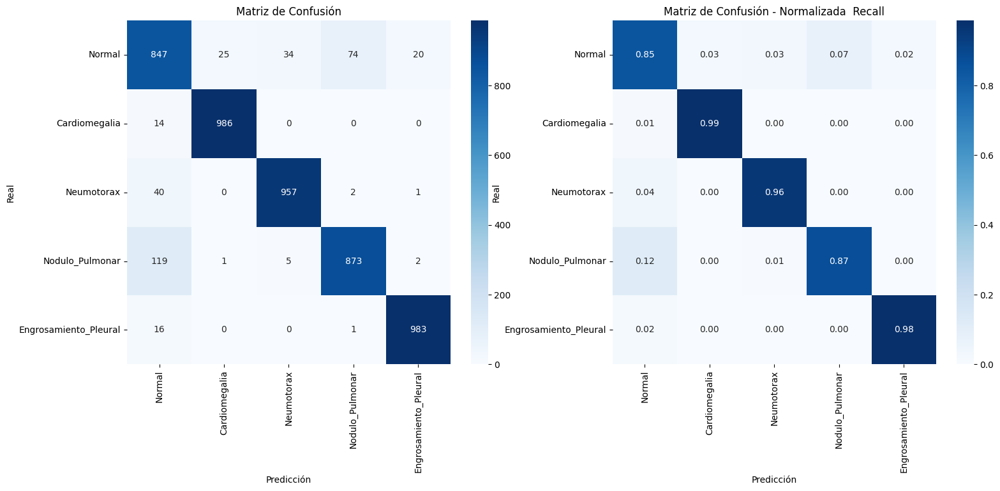



Curvas de Entrenamiento: RESNET50


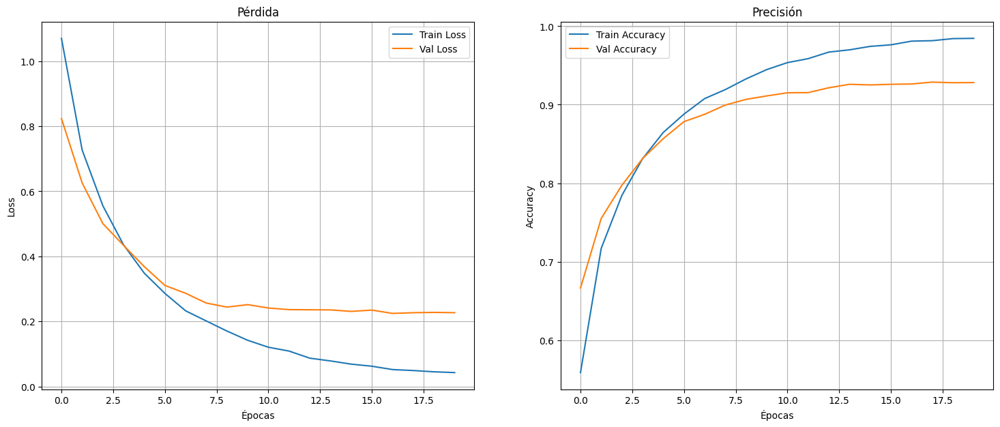


Resumen para resnet50:
   Mejor Val Loss: 0.2248
   Mejor Val Acc:  0.9264 (en la época 17)


In [ ]:
#Guardar el historial para este modelo
history[nombre_modelo] = history

modelo_final = visualizar_resultados(
    nombre_arquitectura=nombre_modelo,
    history=history,
    test_loader=test_loader,
    CLASSES=clases_seleccionadas,
    device=device
)


best_epoch_idx = np.argmin(history['val_loss'])
print(f"\nResumen para {nombre_modelo}:")
print(f"   Mejor Val Loss: {history['val_loss'][best_epoch_idx]:.4f}")
print(f"   Mejor Val Acc:  {history['val_acc'][best_epoch_idx]:.4f} (en la época {best_epoch_idx + 1})")

###DenseNet121

In [ ]:
nombre_modelo = 'densenet121'

#Configurar el experimento
modelo, optimizer, criterion, ruta_guardado = configurar_experimento(
    nombre_arquitectura=nombre_modelo,
    num_clases=len(clases_seleccionadas),
    device=device
)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 56.2MB/s]


In [ ]:
#Ejecutar el entrenamiento
history = ejecutar_entrenamiento(
    modelo=modelo,
    nombre_arquitectura=nombre_modelo,
    optimizer=optimizer,
    criterion=criterion,
    ruta_modelo_guardado=ruta_guardado,
    train_loader=train_loader,
    val_loader=val_loader,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    epochs=20,
    device=device
)

Entrenamiento - 'densenet121'

Epoch [1/20] - Train Acc: 0.5260 | Val Acc: 0.6651 | Val Loss: 0.8525 | LR: 9.9e-05
   +++++ Mejora en validación. Modelo guardado en: /content/densenet121_definitivo.pth
Epoch [2/20] - Train Acc: 0.6820 | Val Acc: 0.7313 | Val Loss: 0.6903 | LR: 9.8e-05
   +++++ Mejora en validación. Modelo guardado en: /content/densenet121_definitivo.pth
Epoch [3/20] - Train Acc: 0.7562 | Val Acc: 0.7656 | Val Loss: 0.5990 | LR: 9.5e-05
   +++++ Mejora en validación. Modelo guardado en: /content/densenet121_definitivo.pth
Epoch [4/20] - Train Acc: 0.8123 | Val Acc: 0.8132 | Val Loss: 0.4743 | LR: 9.1e-05
   +++++ Mejora en validación. Modelo guardado en: /content/densenet121_definitivo.pth
Epoch [5/20] - Train Acc: 0.8483 | Val Acc: 0.8478 | Val Loss: 0.3891 | LR: 8.6e-05
   +++++ Mejora en validación. Modelo guardado en: /content/densenet121_definitivo.pth
Epoch [6/20] - Train Acc: 0.8742 | Val Acc: 0.8510 | Val Loss: 0.3907 | LR: 8.0e-05
Epoch [7/20] - Train Acc: 0.89

In [ ]:
reporte_de_recursos_completo()

Reporte - Consumo Computacional y Recursos:
   - CPU Modelo      : Intel(R) Xeon(R) CPU @ 2.20GHz
   - CPU Uso         : 73.6%
   - RAM del Sistema : 3.91 GB / 83.48 GB
   - GPU Modelo      : NVIDIA A100-SXM4-40GB
   - GPU RAM Uso     : 0.93 GB / 40.00 GB (Después de limpiar caché)




Reporte de Clasificación (Test Set):
                       precision    recall  f1-score   support

               Normal     0.8239    0.8420    0.8328      1000
        Cardiomegalia     0.9612    0.9900    0.9754      1000
           Neumotorax     0.9515    0.9610    0.9562      1000
      Nodulo_Pulmonar     0.9348    0.8600    0.8958      1000
Engrosamiento_Pleural     0.9705    0.9880    0.9792      1000

             accuracy                         0.9282      5000
            macro avg     0.9284    0.9282    0.9279      5000
         weighted avg     0.9284    0.9282    0.9279      5000



Evaluación: DENSENET121


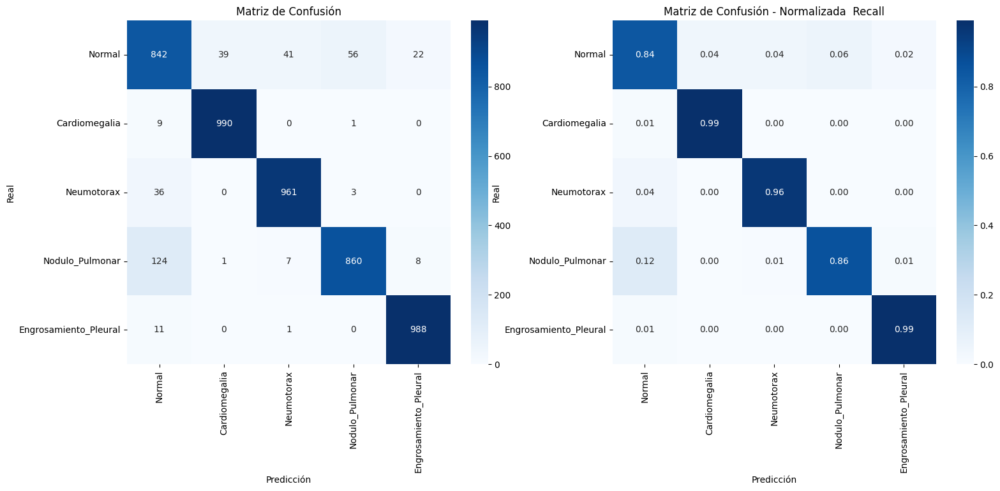



Curvas de Entrenamiento: DENSENET121


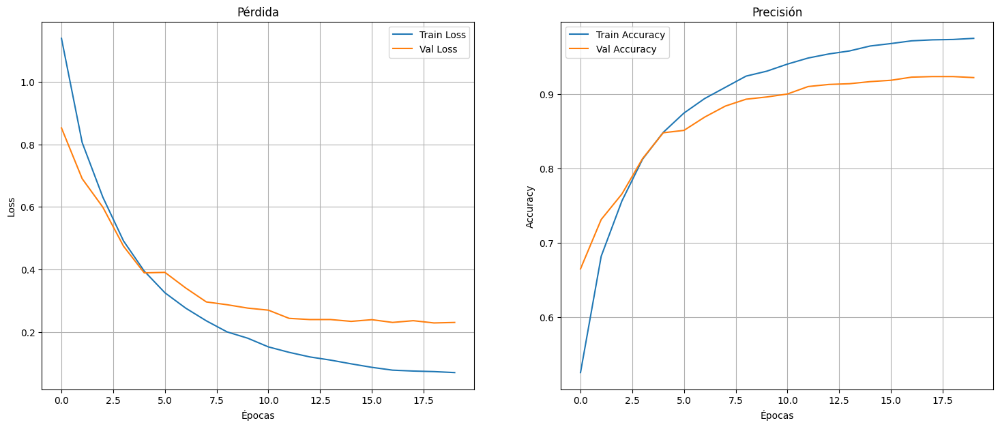


Resumen para densenet121:
   Mejor Val Loss: 0.2290
   Mejor Val Acc:  0.9232 (en la época 19)


In [ ]:
#Guardar el historial para este modelo
history[nombre_modelo] = history

modelo_final = visualizar_resultados(
    nombre_arquitectura=nombre_modelo,
    history=history,
    test_loader=test_loader,
    CLASSES=clases_seleccionadas,
    device=device
)


best_epoch_idx = np.argmin(history['val_loss'])
print(f"\nResumen para {nombre_modelo}:")
print(f"   Mejor Val Loss: {history['val_loss'][best_epoch_idx]:.4f}")
print(f"   Mejor Val Acc:  {history['val_acc'][best_epoch_idx]:.4f} (en la época {best_epoch_idx + 1})")

###MobileNetV2

In [ ]:
nombre_modelo = 'mobilenet_v2'

#Configurar el experimento
modelo, optimizer, criterion, ruta_guardado = configurar_experimento(
    nombre_arquitectura=nombre_modelo,
    num_clases=len(clases_seleccionadas),
    device=device
)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 56.0MB/s]


In [ ]:
#Ejecutar el entrenamiento
history = ejecutar_entrenamiento(
    modelo=modelo,
    nombre_arquitectura=nombre_modelo,
    optimizer=optimizer,
    criterion=criterion,
    ruta_modelo_guardado=ruta_guardado,
    train_loader=train_loader,
    val_loader=val_loader,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    epochs=20,
    device=device
)

Entrenamiento - 'mobilenet_v2'

Epoch [1/20] - Train Acc: 0.4691 | Val Acc: 0.5685 | Val Loss: 1.0746 | LR: 9.9e-05
   +++++ Mejora en validación. Modelo guardado en: /content/mobilenet_v2_definitivo.pth
Epoch [2/20] - Train Acc: 0.5917 | Val Acc: 0.6135 | Val Loss: 0.9578 | LR: 9.8e-05
   +++++ Mejora en validación. Modelo guardado en: /content/mobilenet_v2_definitivo.pth
Epoch [3/20] - Train Acc: 0.6291 | Val Acc: 0.6273 | Val Loss: 0.9132 | LR: 9.5e-05
   +++++ Mejora en validación. Modelo guardado en: /content/mobilenet_v2_definitivo.pth
Epoch [4/20] - Train Acc: 0.6546 | Val Acc: 0.6571 | Val Loss: 0.8567 | LR: 9.1e-05
   +++++ Mejora en validación. Modelo guardado en: /content/mobilenet_v2_definitivo.pth
Epoch [5/20] - Train Acc: 0.6758 | Val Acc: 0.6707 | Val Loss: 0.8101 | LR: 8.6e-05
   +++++ Mejora en validación. Modelo guardado en: /content/mobilenet_v2_definitivo.pth
Epoch [6/20] - Train Acc: 0.6916 | Val Acc: 0.6903 | Val Loss: 0.7711 | LR: 8.0e-05
   +++++ Mejora en valid

In [ ]:
reporte_de_recursos_completo()

Reporte - Consumo Computacional y Recursos:
   - CPU Modelo      : Intel(R) Xeon(R) CPU @ 2.20GHz
   - CPU Uso         : 70.2%
   - RAM del Sistema : 3.99 GB / 83.48 GB
   - GPU Modelo      : NVIDIA A100-SXM4-40GB
   - GPU RAM Uso     : 0.90 GB / 40.00 GB (Después de limpiar caché)




Reporte de Clasificación (Test Set):
                       precision    recall  f1-score   support

               Normal     0.6971    0.8470    0.7648      1000
        Cardiomegalia     0.8725    0.9310    0.9008      1000
           Neumotorax     0.8207    0.7280    0.7716      1000
      Nodulo_Pulmonar     0.7181    0.5580    0.6280      1000
Engrosamiento_Pleural     0.7571    0.7980    0.7770      1000

             accuracy                         0.7724      5000
            macro avg     0.7731    0.7724    0.7684      5000
         weighted avg     0.7731    0.7724    0.7684      5000



Evaluación: MOBILENET_V2


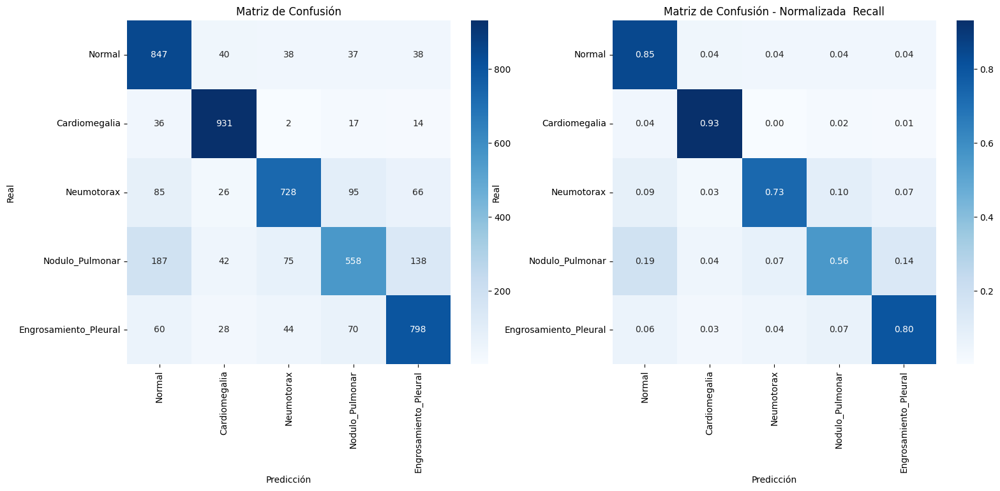



Curvas de Entrenamiento: MOBILENET_V2


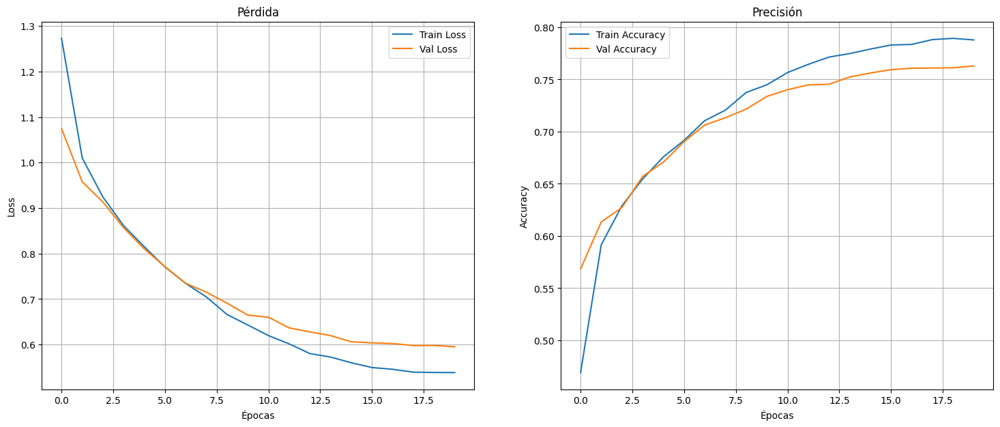


Resumen para mobilenet_v2:
   Mejor Val Loss: 0.5951
   Mejor Val Acc:  0.7630 (en la época 20)


In [ ]:
#Guardar el historial para este modelo
history[nombre_modelo] = history

modelo_final = visualizar_resultados(
    nombre_arquitectura=nombre_modelo,
    history=history,
    test_loader=test_loader,
    CLASSES=clases_seleccionadas,
    device=device
)


best_epoch_idx = np.argmin(history['val_loss'])
print(f"\nResumen para {nombre_modelo}:")
print(f"   Mejor Val Loss: {history['val_loss'][best_epoch_idx]:.4f}")
print(f"   Mejor Val Acc:  {history['val_acc'][best_epoch_idx]:.4f} (en la época {best_epoch_idx + 1})")

#Resultados de Explicabilidad con Grad-CAM

###Aciertos

In [ ]:
CLASSES = ['Normal', 'Cardiomegalia', 'Neumotorax', 'Nodulo_Pulmonar', 'Engrosamiento_Pleural']
indices_aciertos, indices_errores = seleccionar_imagenes_referencia('densenet121', test_loader, CLASSES, device)
print("\n--- Conjunto Fijo de Aciertos Seleccionados ---", indices_aciertos)
print("--- Conjunto Fijo de Errores Seleccionados ---", indices_errores[:2])

Imágenes de referencia del modelo: 'densenet121'

--- Conjunto Fijo de Aciertos Seleccionados --- {'Normal': 2535, 'Cardiomegalia': 1653, 'Neumotorax': 736, 'Nodulo_Pulmonar': 2034, 'Engrosamiento_Pleural': 4504}
--- Conjunto Fijo de Errores Seleccionados --- [367, 4540]


####ResNet50


ACIERTOS con el modelo: RESNET50
Acierto de 'Normal' (Índice: 2535)
Análisis de Imagen (Índice en Test Set: 2535) ---
Etiqueta Real:     Normal
Predicción Modelo:  Normal (ACIERTO)


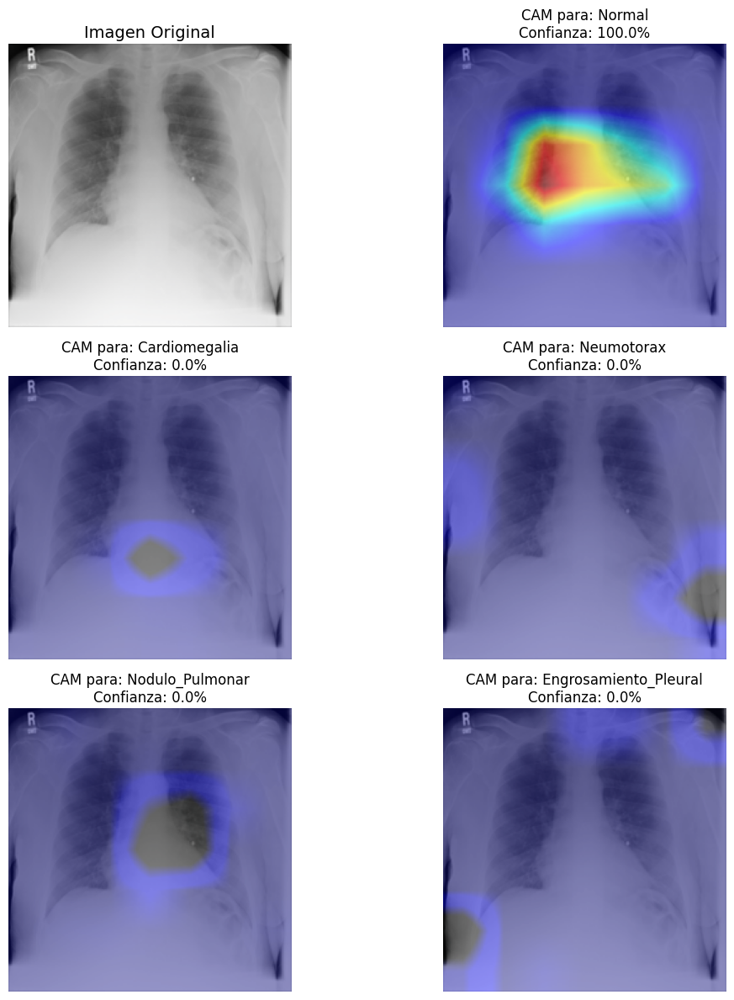

Acierto de 'Cardiomegalia' (Índice: 1653)
Análisis de Imagen (Índice en Test Set: 1653) ---
Etiqueta Real:     Cardiomegalia
Predicción Modelo:  Cardiomegalia (ACIERTO)


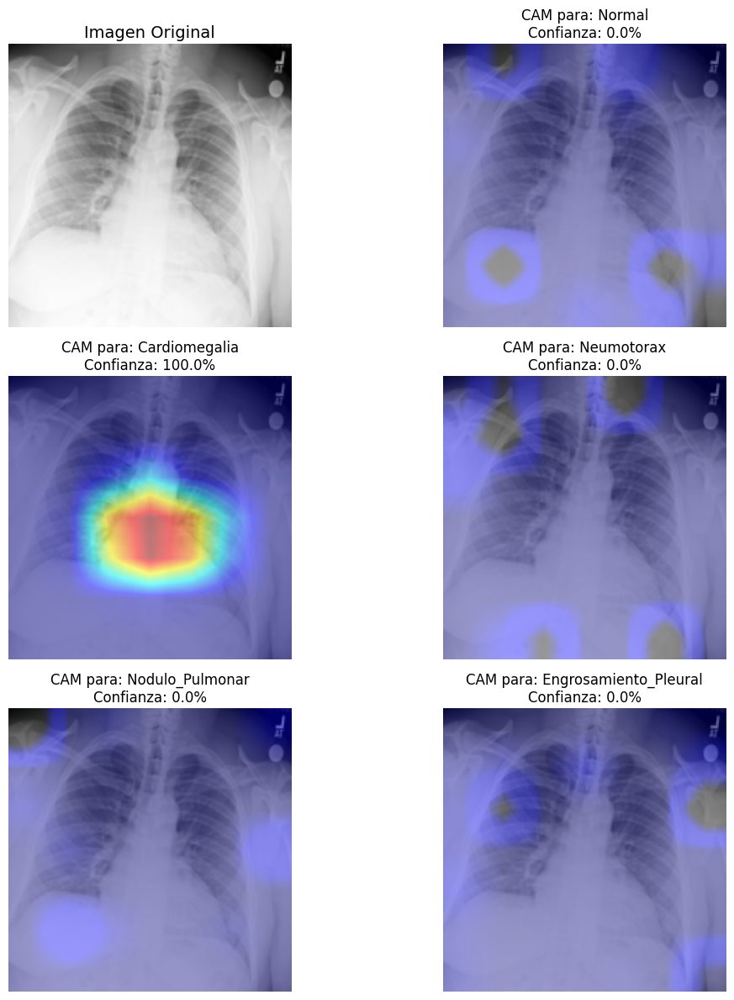

Acierto de 'Neumotorax' (Índice: 736)
Análisis de Imagen (Índice en Test Set: 736) ---
Etiqueta Real:     Neumotorax
Predicción Modelo:  Neumotorax (ACIERTO)


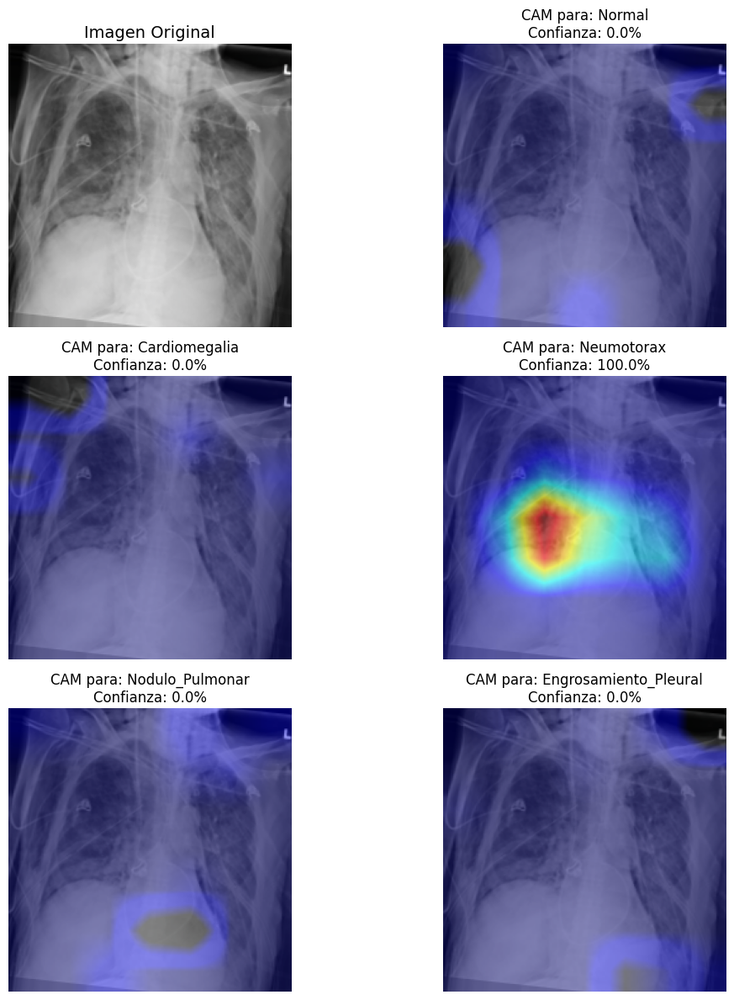

Acierto de 'Nodulo_Pulmonar' (Índice: 2034)
Análisis de Imagen (Índice en Test Set: 2034) ---
Etiqueta Real:     Nodulo_Pulmonar
Predicción Modelo:  Nodulo_Pulmonar (ACIERTO)


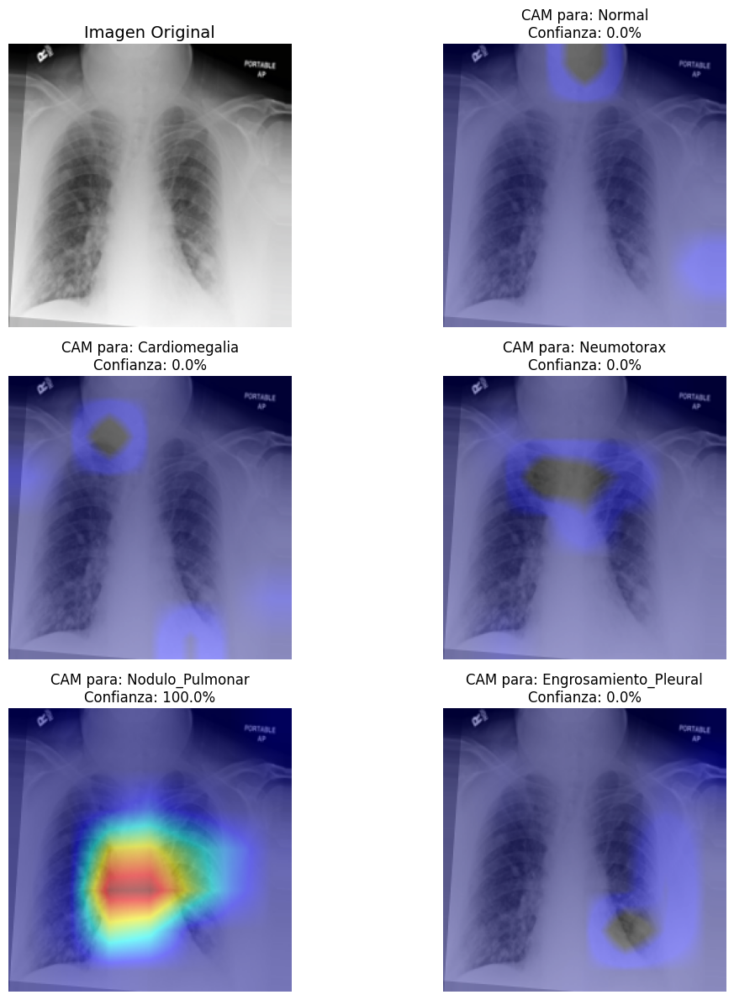

Acierto de 'Engrosamiento_Pleural' (Índice: 4504)
Análisis de Imagen (Índice en Test Set: 4504) ---
Etiqueta Real:     Engrosamiento_Pleural
Predicción Modelo:  Engrosamiento_Pleural (ACIERTO)


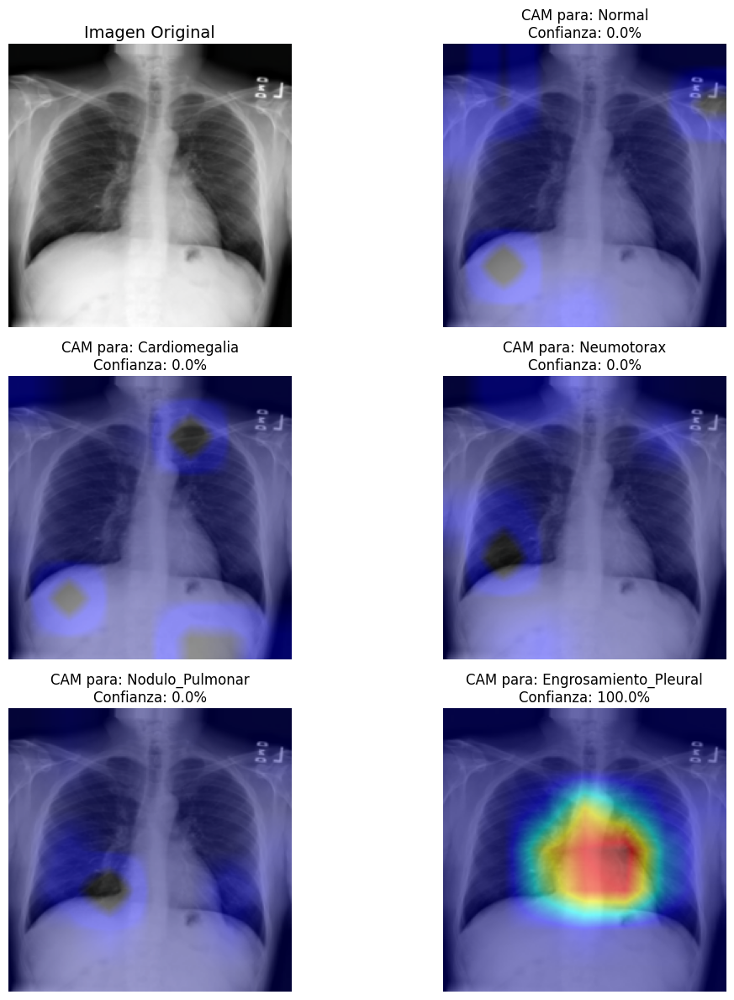

In [ ]:
nombre_modelo = 'resnet50'
ejecutar_analisis_aciertos(nombre_modelo, indices_aciertos, CLASSES, device)

####DenseNet121


ACIERTOS con el modelo: DENSENET121
Acierto de 'Normal' (Índice: 2535)
Análisis de Imagen (Índice en Test Set: 2535) ---
Etiqueta Real:     Normal
Predicción Modelo:  Normal (ACIERTO)


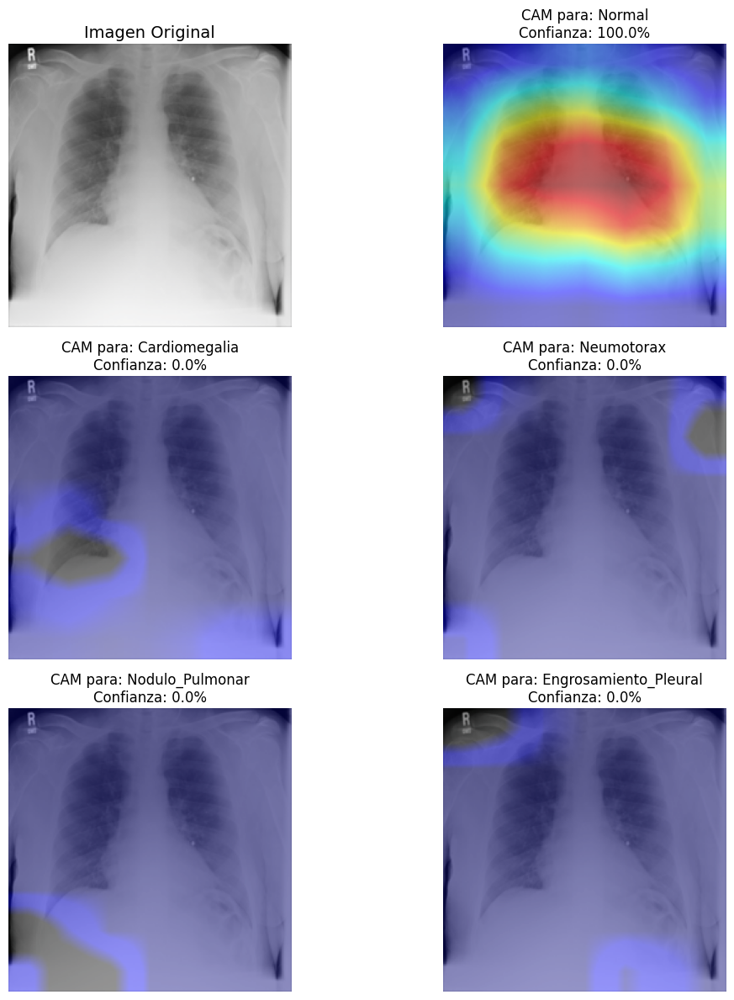

Acierto de 'Cardiomegalia' (Índice: 1653)
Análisis de Imagen (Índice en Test Set: 1653) ---
Etiqueta Real:     Cardiomegalia
Predicción Modelo:  Cardiomegalia (ACIERTO)


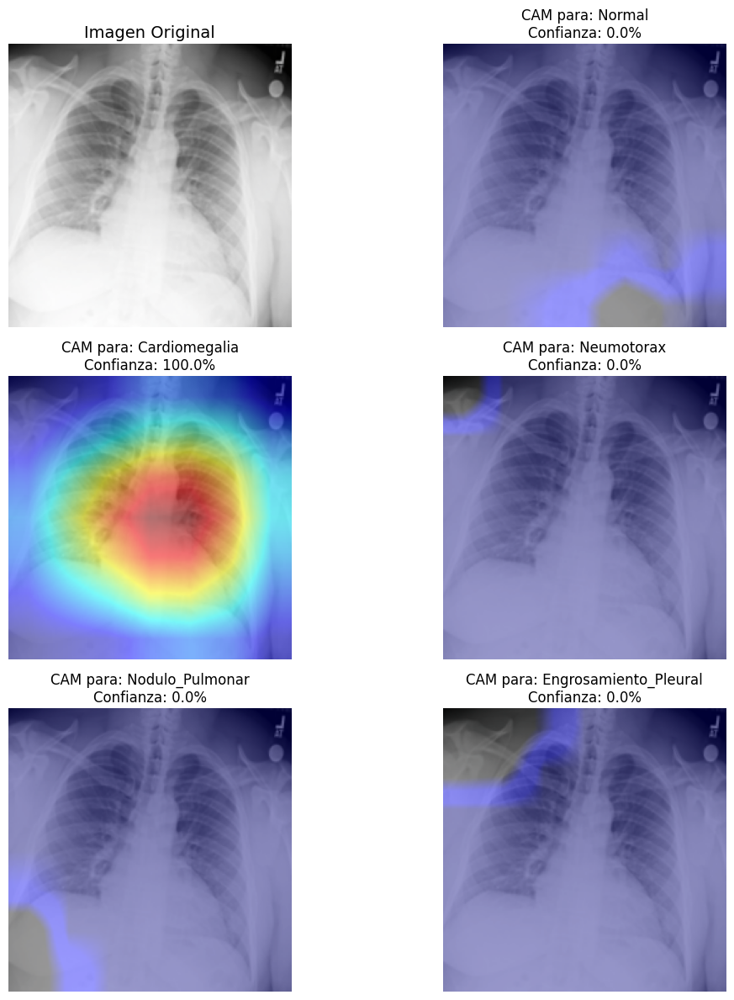

Acierto de 'Neumotorax' (Índice: 736)
Análisis de Imagen (Índice en Test Set: 736) ---
Etiqueta Real:     Neumotorax
Predicción Modelo:  Neumotorax (ACIERTO)


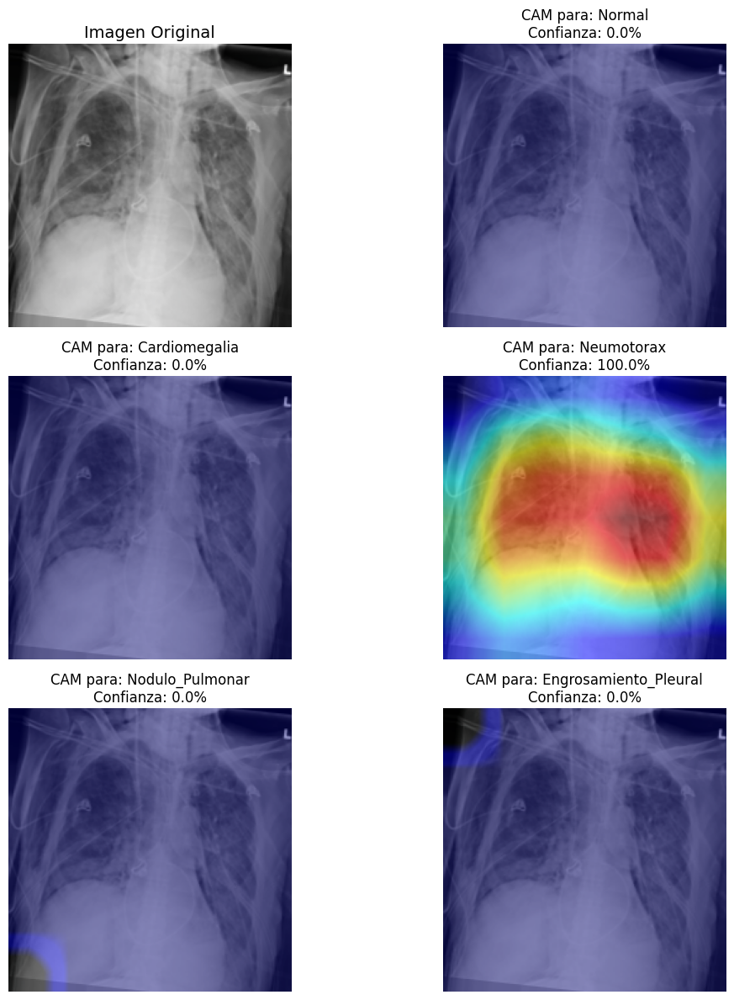

Acierto de 'Nodulo_Pulmonar' (Índice: 2034)
Análisis de Imagen (Índice en Test Set: 2034) ---
Etiqueta Real:     Nodulo_Pulmonar
Predicción Modelo:  Nodulo_Pulmonar (ACIERTO)


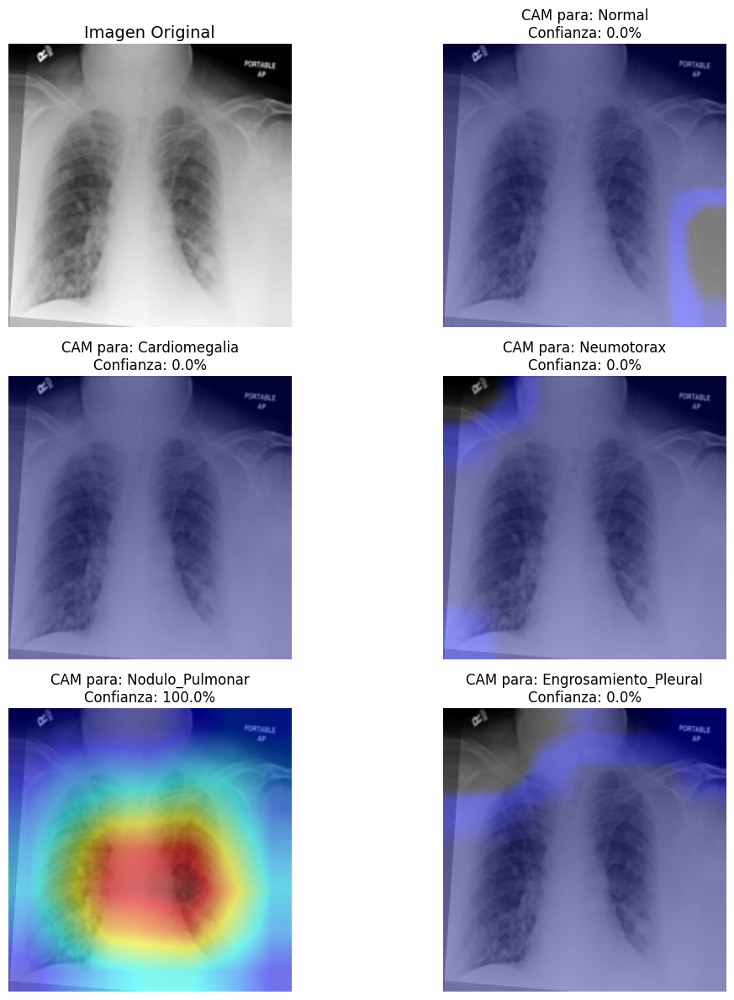

Acierto de 'Engrosamiento_Pleural' (Índice: 4504)
Análisis de Imagen (Índice en Test Set: 4504) ---
Etiqueta Real:     Engrosamiento_Pleural
Predicción Modelo:  Engrosamiento_Pleural (ACIERTO)


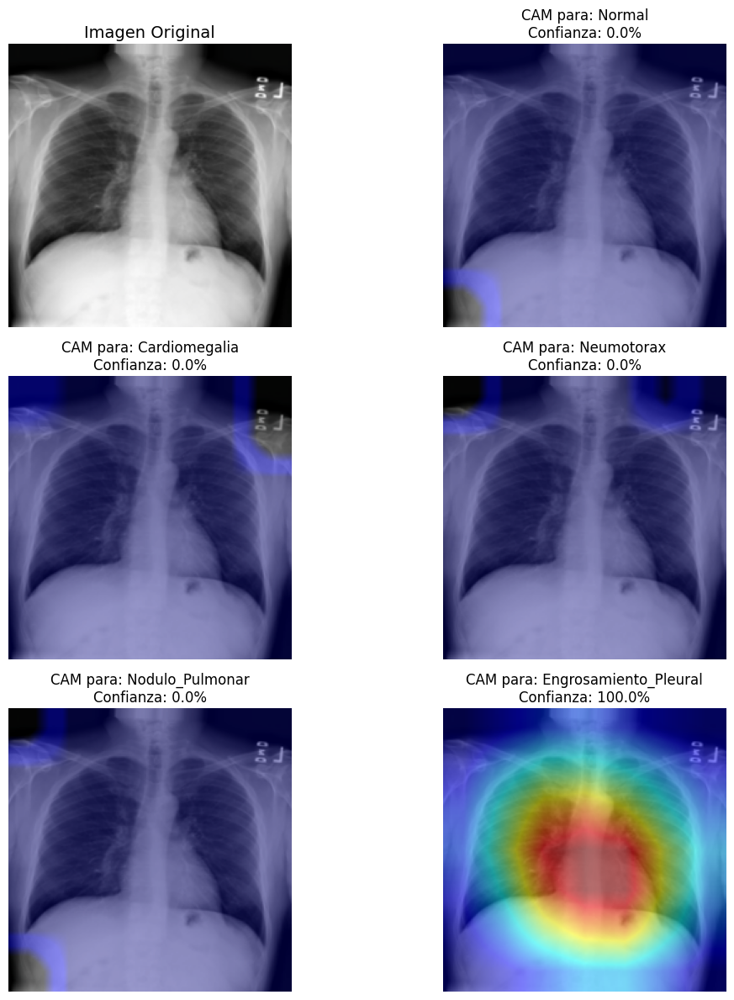

In [ ]:
nombre_modelo = 'densenet121'
ejecutar_analisis_aciertos(nombre_modelo, indices_aciertos, CLASSES, device)

####MobileNetV2


ACIERTOS con el modelo: MOBILENET_V2
Acierto de 'Normal' (Índice: 2535)
Análisis de Imagen (Índice en Test Set: 2535) ---
Etiqueta Real:     Normal
Predicción Modelo:  Normal (ACIERTO)


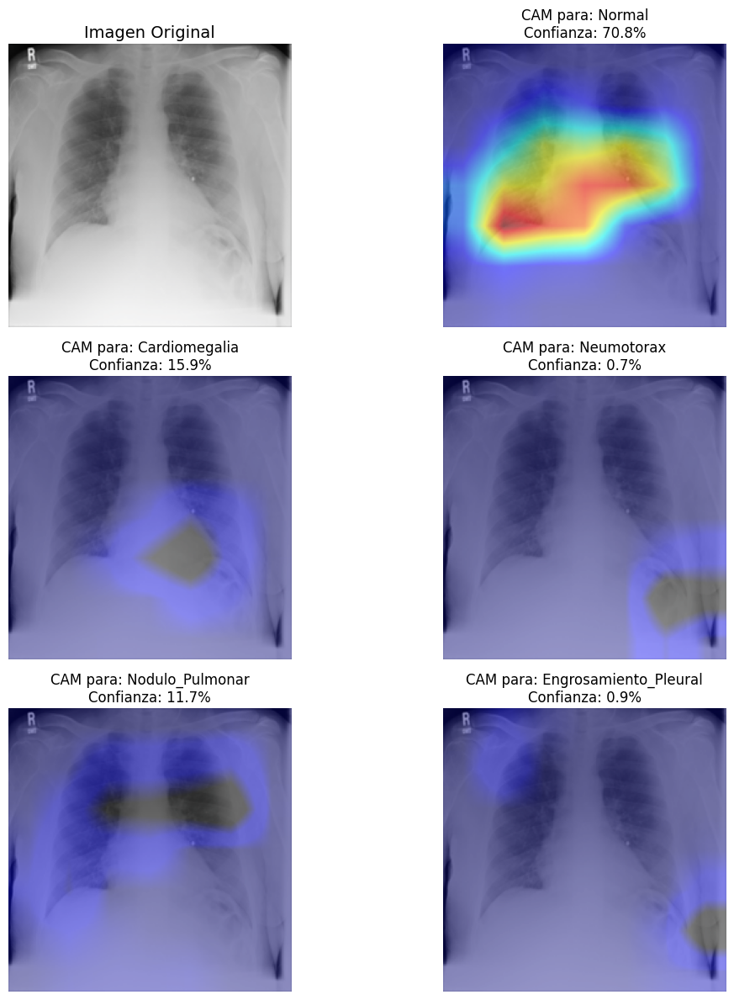

Acierto de 'Cardiomegalia' (Índice: 1653)
Análisis de Imagen (Índice en Test Set: 1653) ---
Etiqueta Real:     Cardiomegalia
Predicción Modelo:  Cardiomegalia (ACIERTO)


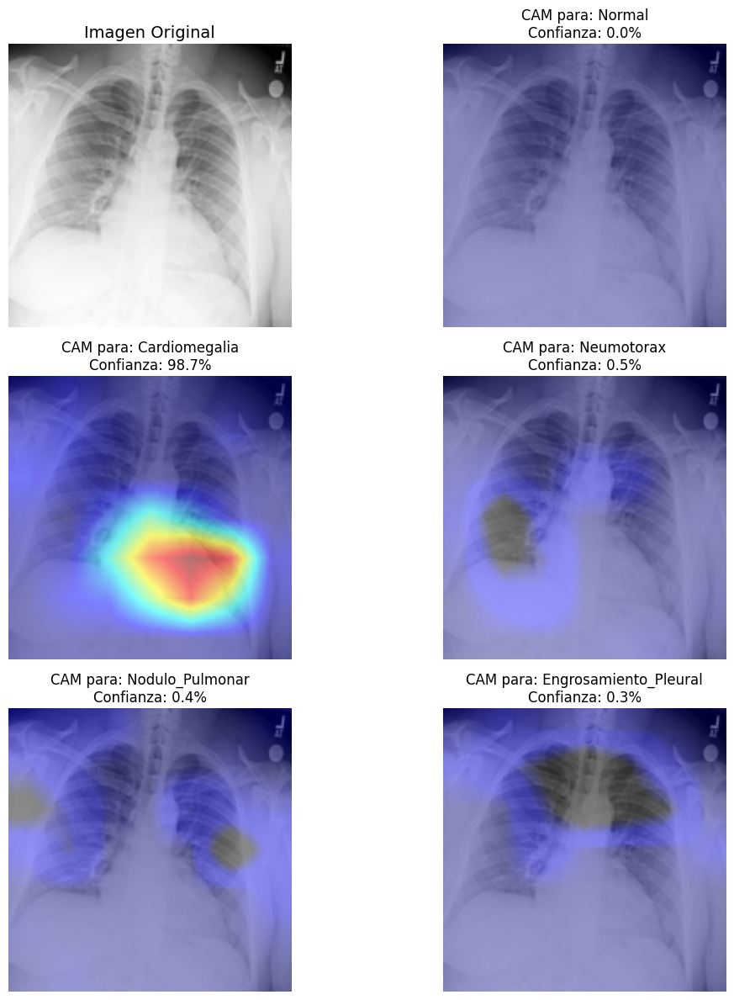

Acierto de 'Neumotorax' (Índice: 736)
Análisis de Imagen (Índice en Test Set: 736) ---
Etiqueta Real:     Neumotorax
Predicción Modelo:  Neumotorax (ACIERTO)


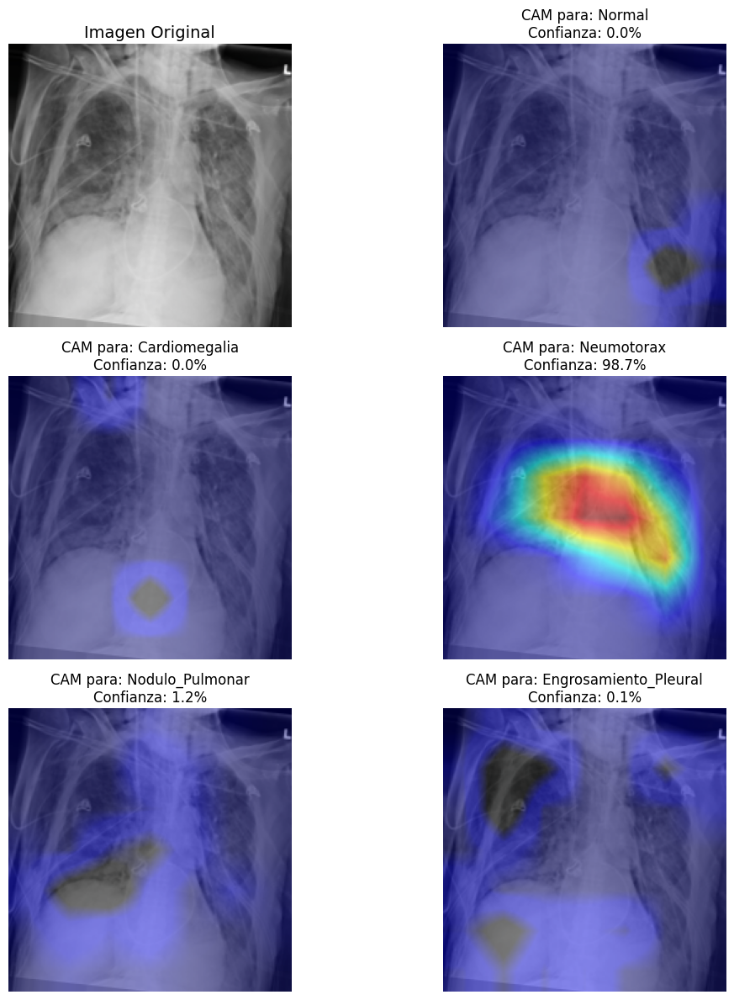

Acierto de 'Nodulo_Pulmonar' (Índice: 2034)
Análisis de Imagen (Índice en Test Set: 2034) ---
Etiqueta Real:     Nodulo_Pulmonar
Predicción Modelo:  Nodulo_Pulmonar (ACIERTO)


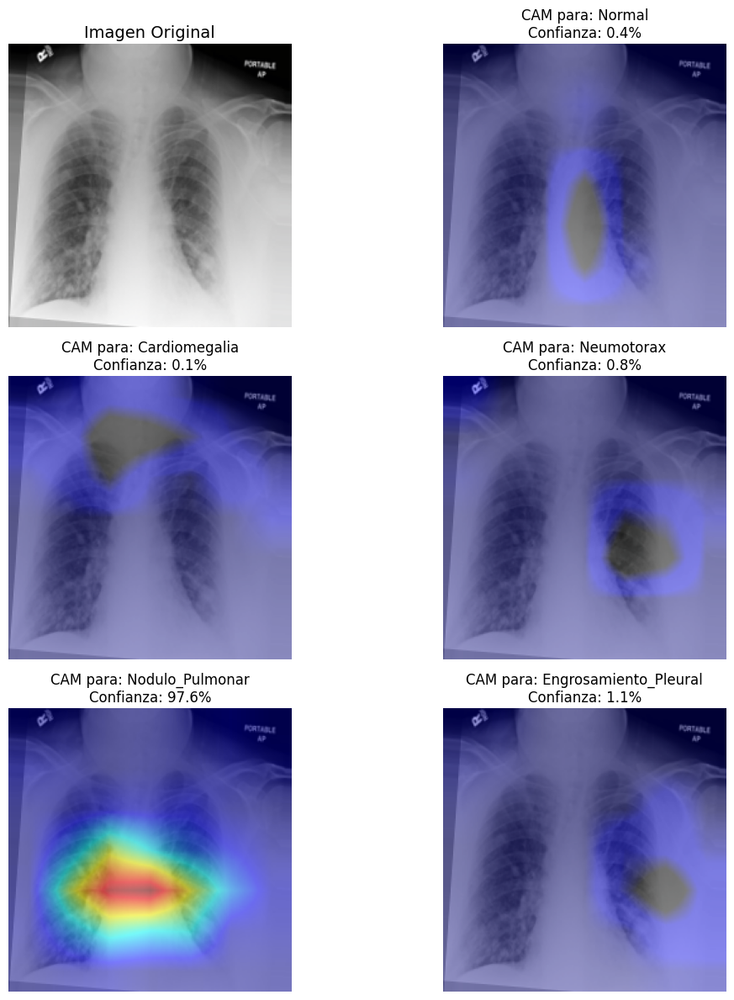

Acierto de 'Engrosamiento_Pleural' (Índice: 4504)
Análisis de Imagen (Índice en Test Set: 4504) ---
Etiqueta Real:     Engrosamiento_Pleural
Predicción Modelo:  Engrosamiento_Pleural (ACIERTO)


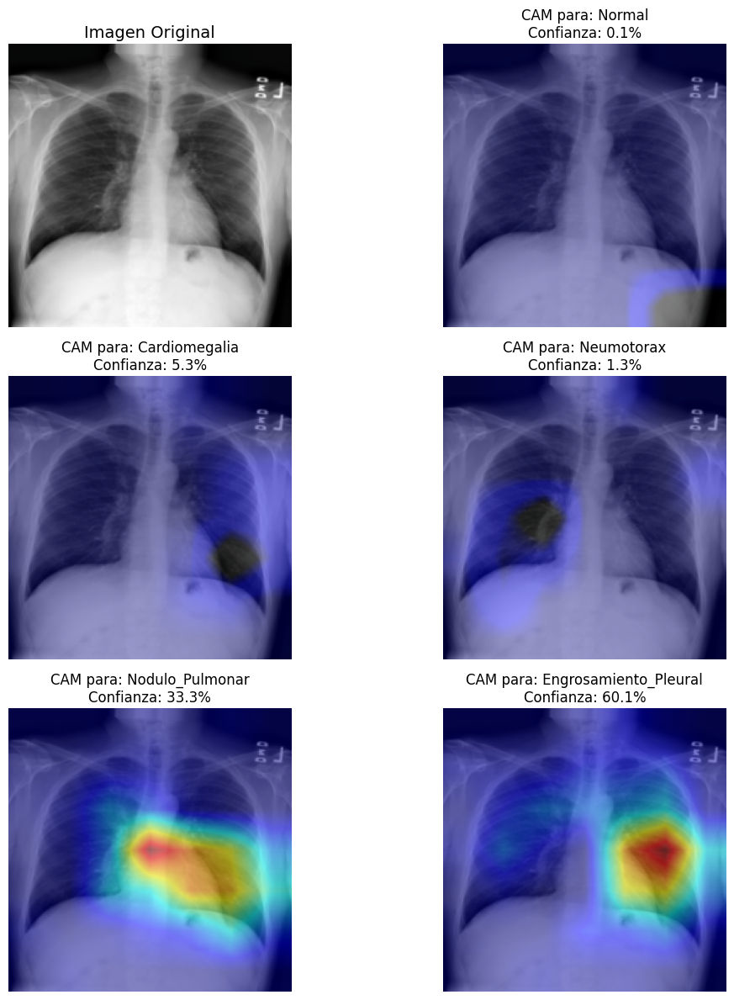

In [ ]:
nombre_modelo = 'mobilenet_v2'
ejecutar_analisis_aciertos(nombre_modelo, indices_aciertos, CLASSES, device)

###Errores de Predicción (Normal, Neumotórax)

####ResNet50


ERRORES con el modelo: RESNET50
Error Notable #1 (Índice: 367)
Análisis de Imagen (Índice en Test Set: 367) ---
Etiqueta Real:     Normal
Predicción Modelo:  Nodulo_Pulmonar (ERROR)


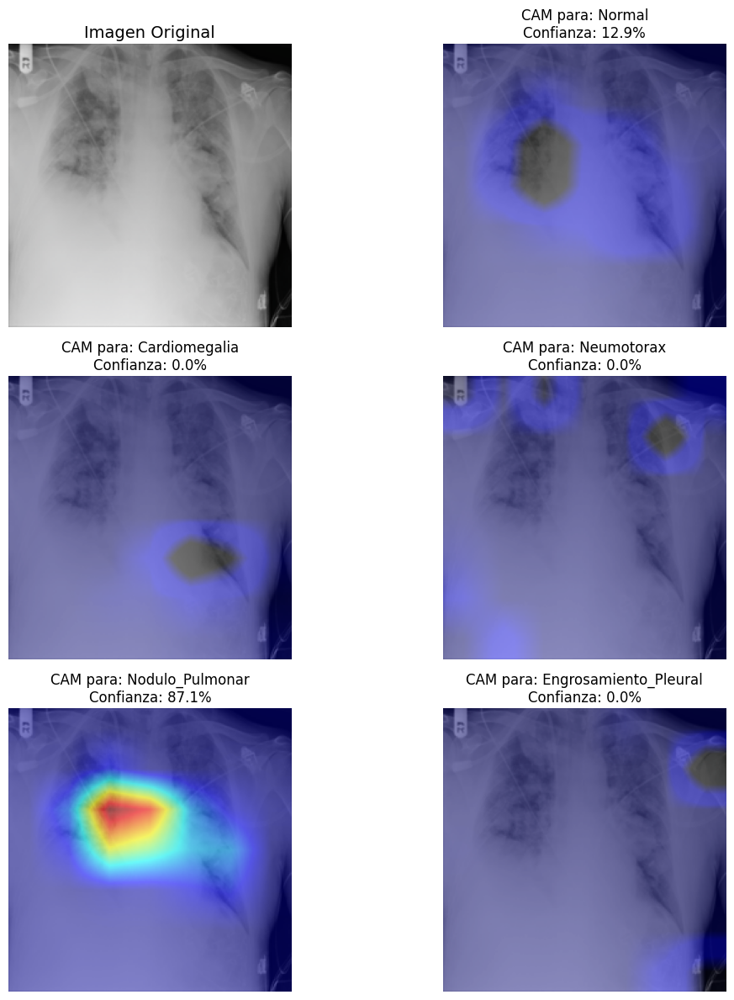

Error Notable #2 (Índice: 4540)
Análisis de Imagen (Índice en Test Set: 4540) ---
Etiqueta Real:     Neumotorax
Predicción Modelo:  Neumotorax (ACIERTO)


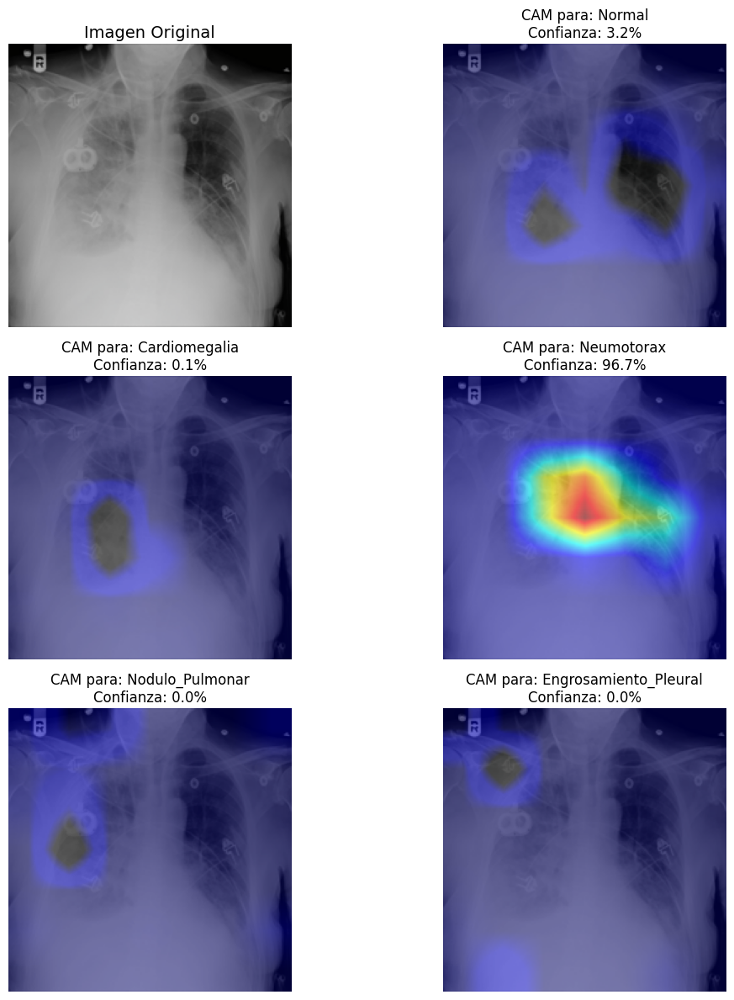

In [ ]:
nombre_modelo = 'resnet50'
ejecutar_analisis_errores(nombre_modelo, indices_errores, CLASSES, device)

####DenseNet121


ERRORES con el modelo: DENSENET121
Error Notable #1 (Índice: 367)
Análisis de Imagen (Índice en Test Set: 367) ---
Etiqueta Real:     Normal
Predicción Modelo:  Nodulo_Pulmonar (ERROR)


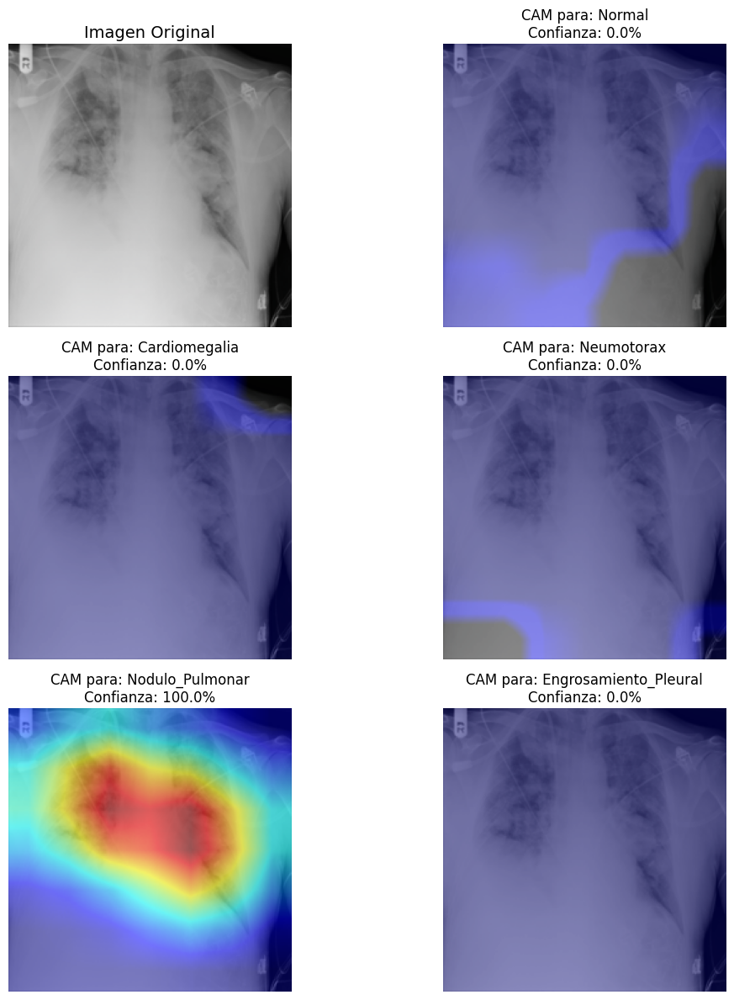

Error Notable #2 (Índice: 4540)
Análisis de Imagen (Índice en Test Set: 4540) ---
Etiqueta Real:     Neumotorax
Predicción Modelo:  Normal (ERROR)


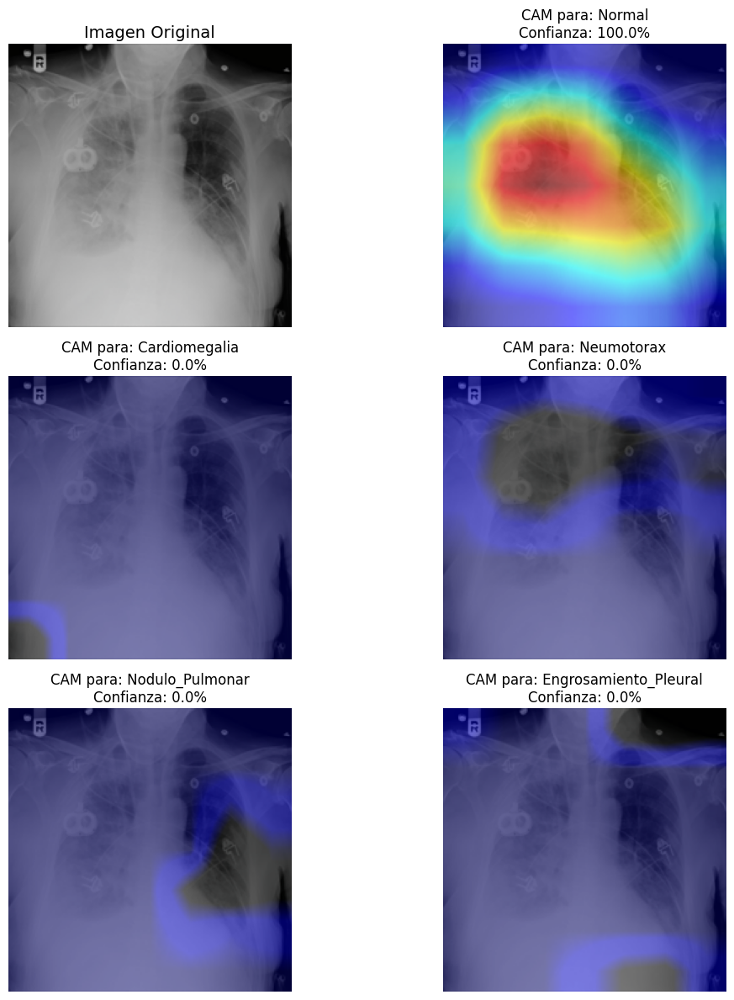

In [ ]:
nombre_modelo = 'densenet121'
ejecutar_analisis_errores(nombre_modelo, indices_errores, CLASSES, device)

####MobileNetV2


ERRORES con el modelo: MOBILENET_V2
Error Notable #1 (Índice: 367)
Análisis de Imagen (Índice en Test Set: 367) ---
Etiqueta Real:     Normal
Predicción Modelo:  Normal (ACIERTO)


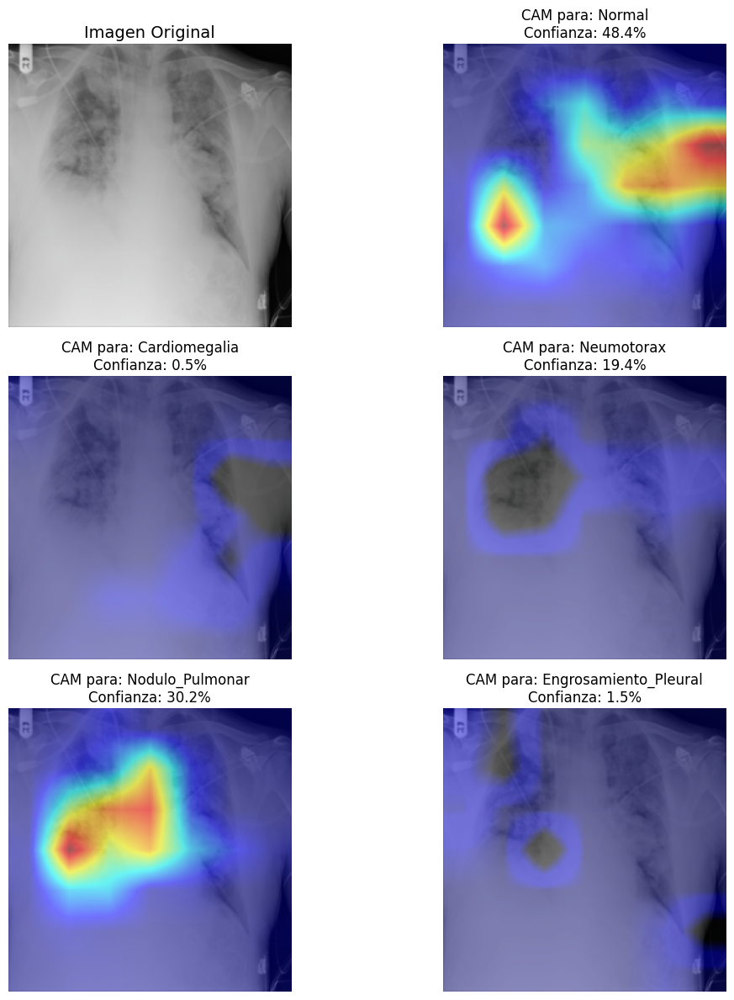

Error Notable #2 (Índice: 4540)
Análisis de Imagen (Índice en Test Set: 4540) ---
Etiqueta Real:     Neumotorax
Predicción Modelo:  Normal (ERROR)


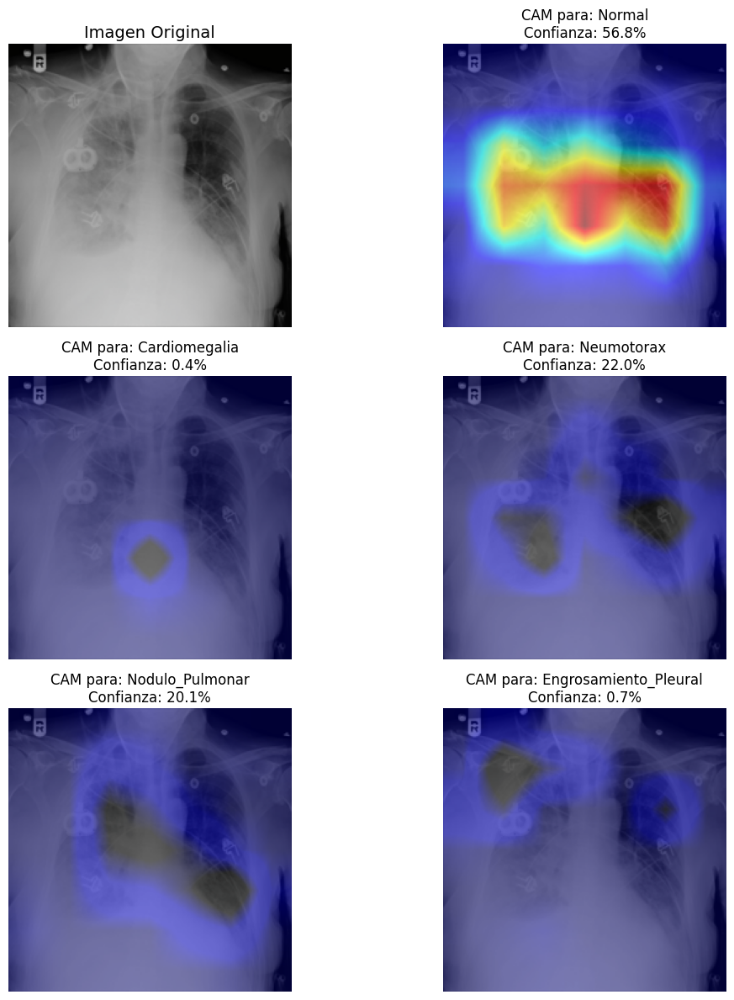

In [ ]:
nombre_modelo = 'mobilenet_v2'
ejecutar_analisis_errores(nombre_modelo, indices_errores, CLASSES, device)